# Business problem

In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.

For many incumbent operators, retaining high profitable customers is the number one business goal.
To reduce customer churn, telecom companies need to predict which customers are at high risk of churn.
In this project, you will analyse customer-level data of a leading telecom firm, build predictive models to identify customers at high risk of churn and identify the main indicators of churn

The dataset contains customer-level information for a span of four consecutive months - June, July, August and September. The months are encoded as 6, 7, 8 and 9, respectively. 

The business objective is to predict the churn in the last (i.e. the ninth) month using the data (features) from the first three months. To do this task well, understanding the typical customer behaviour during churn will be helpful

In [1]:
# importing libraries
import numpy as np, pandas as pd, seaborn as sns, matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_columns', 1000)
pd.set_option('display.width', 1000)
pd.set_option('display.float_format', lambda x: '%.3f' % x)

### Data

In [2]:
telecom_main_df = pd.read_csv("telecom_churn_data.csv")
telecom_main_df.head(10)

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.000,0.000,0.000,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,nan,nan,0.000,nan,nan,nan,0.000,nan,nan,nan,0.000,nan,nan,nan,0.000,nan,nan,nan,0.000,nan,nan,nan,0.000,nan,nan,nan,0.000,nan,nan,nan,0.000,nan,nan,nan,0.000,nan,nan,nan,0.000,nan,nan,nan,0.000,nan,nan,nan,0.000,nan,nan,nan,0.000,nan,nan,nan,0.000,nan,nan,nan,0.000,nan,nan,nan,0.000,nan,nan,nan,0.000,nan,0.000,0.000,0.000,0.000,nan,nan,0.160,nan,nan,nan,4.130,nan,nan,nan,1.150,nan,nan,nan,5.440,nan,nan,nan,0.000,nan,nan,nan,0.000,nan,nan,nan,0.000,nan,nan,nan,0.000,nan,nan,nan,0.000,nan,0.000,0.000,5.440,0.000,nan,nan,

In [3]:
telecom_main_df.shape
list(telecom_main_df.columns)

['mobile_number',
 'circle_id',
 'loc_og_t2o_mou',
 'std_og_t2o_mou',
 'loc_ic_t2o_mou',
 'last_date_of_month_6',
 'last_date_of_month_7',
 'last_date_of_month_8',
 'last_date_of_month_9',
 'arpu_6',
 'arpu_7',
 'arpu_8',
 'arpu_9',
 'onnet_mou_6',
 'onnet_mou_7',
 'onnet_mou_8',
 'onnet_mou_9',
 'offnet_mou_6',
 'offnet_mou_7',
 'offnet_mou_8',
 'offnet_mou_9',
 'roam_ic_mou_6',
 'roam_ic_mou_7',
 'roam_ic_mou_8',
 'roam_ic_mou_9',
 'roam_og_mou_6',
 'roam_og_mou_7',
 'roam_og_mou_8',
 'roam_og_mou_9',
 'loc_og_t2t_mou_6',
 'loc_og_t2t_mou_7',
 'loc_og_t2t_mou_8',
 'loc_og_t2t_mou_9',
 'loc_og_t2m_mou_6',
 'loc_og_t2m_mou_7',
 'loc_og_t2m_mou_8',
 'loc_og_t2m_mou_9',
 'loc_og_t2f_mou_6',
 'loc_og_t2f_mou_7',
 'loc_og_t2f_mou_8',
 'loc_og_t2f_mou_9',
 'loc_og_t2c_mou_6',
 'loc_og_t2c_mou_7',
 'loc_og_t2c_mou_8',
 'loc_og_t2c_mou_9',
 'loc_og_mou_6',
 'loc_og_mou_7',
 'loc_og_mou_8',
 'loc_og_mou_9',
 'std_og_t2t_mou_6',
 'std_og_t2t_mou_7',
 'std_og_t2t_mou_8',
 'std_og_t2t_mou_9',
 's

In [4]:
telecom_main_df.info(verbose=1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 226 columns):
mobile_number               int64
circle_id                   int64
loc_og_t2o_mou              float64
std_og_t2o_mou              float64
loc_ic_t2o_mou              float64
last_date_of_month_6        object
last_date_of_month_7        object
last_date_of_month_8        object
last_date_of_month_9        object
arpu_6                      float64
arpu_7                      float64
arpu_8                      float64
arpu_9                      float64
onnet_mou_6                 float64
onnet_mou_7                 float64
onnet_mou_8                 float64
onnet_mou_9                 float64
offnet_mou_6                float64
offnet_mou_7                float64
offnet_mou_8                float64
offnet_mou_9                float64
roam_ic_mou_6               float64
roam_ic_mou_7               float64
roam_ic_mou_8               float64
roam_ic_mou_9               float6

In [5]:
# Null percentage
round(100*(telecom_main_df.isnull().sum()/len(telecom_main_df.index)), 2)

mobile_number               0.000
circle_id                   0.000
loc_og_t2o_mou              1.020
std_og_t2o_mou              1.020
loc_ic_t2o_mou              1.020
last_date_of_month_6        0.000
last_date_of_month_7        0.600
last_date_of_month_8        1.100
last_date_of_month_9        1.660
arpu_6                      0.000
arpu_7                      0.000
arpu_8                      0.000
arpu_9                      0.000
onnet_mou_6                 3.940
onnet_mou_7                 3.860
onnet_mou_8                 5.380
onnet_mou_9                 7.750
offnet_mou_6                3.940
offnet_mou_7                3.860
offnet_mou_8                5.380
offnet_mou_9                7.750
roam_ic_mou_6               3.940
roam_ic_mou_7               3.860
roam_ic_mou_8               5.380
roam_ic_mou_9               7.750
roam_og_mou_6               3.940
roam_og_mou_7               3.860
roam_og_mou_8               5.380
roam_og_mou_9               7.750
loc_og_t2t_mou

### Data cleaning

In [6]:
# Getting categorical columns
telecom_categorical = telecom_main_df[['night_pck_user_6','night_pck_user_7','night_pck_user_8','night_pck_user_9','fb_user_6','fb_user_7','fb_user_8','fb_user_9']]

for i in telecom_categorical:
    print(telecom_categorical[i].value_counts())
    print('-----------------------------------')

0.000    24522
1.000      631
Name: night_pck_user_6, dtype: int64
-----------------------------------
0.000    24982
1.000      589
Name: night_pck_user_7, dtype: int64
-----------------------------------
0.000    25790
1.000      549
Name: night_pck_user_8, dtype: int64
-----------------------------------
0.000    25508
1.000      414
Name: night_pck_user_9, dtype: int64
-----------------------------------
1.000    23000
0.000     2153
Name: fb_user_6, dtype: int64
-----------------------------------
1.000    23238
0.000     2333
Name: fb_user_7, dtype: int64
-----------------------------------
1.000    23463
0.000     2876
Name: fb_user_8, dtype: int64
-----------------------------------
1.000    22318
0.000     3604
Name: fb_user_9, dtype: int64
-----------------------------------


All the categorical columns are binary and have more than 70% missing values. As this could mean that the user might not have used/registered for those services, it could be beneficial to impute them with either 0

In [7]:
# Imputing categorical columns
telecom_categorical = telecom_categorical.fillna(0)
for i in telecom_categorical:
    print(telecom_categorical[i].value_counts(normalize=True)*100)
    print('-----------------------------------')

0.000   99.369
1.000    0.631
Name: night_pck_user_6, dtype: float64
-----------------------------------
0.000   99.411
1.000    0.589
Name: night_pck_user_7, dtype: float64
-----------------------------------
0.000   99.451
1.000    0.549
Name: night_pck_user_8, dtype: float64
-----------------------------------
0.000   99.586
1.000    0.414
Name: night_pck_user_9, dtype: float64
-----------------------------------
0.000   77.000
1.000   23.000
Name: fb_user_6, dtype: float64
-----------------------------------
0.000   76.762
1.000   23.238
Name: fb_user_7, dtype: float64
-----------------------------------
0.000   76.537
1.000   23.463
Name: fb_user_8, dtype: float64
-----------------------------------
0.000   77.682
1.000   22.318
Name: fb_user_9, dtype: float64
-----------------------------------


The night_pack columns are skewed, hence these will be dropped

In [8]:
# dropping night_pack columns
telecom_categorical.drop(['night_pck_user_6','night_pck_user_7','night_pck_user_8','night_pck_user_9'], axis=1, inplace=True)
telecom_categorical

,fb_user_6,fb_user_7,fb_user_8,fb_user_9
0,1.000,1.000,1.000,0.000
1,0.000,1.000,1.000,0.000
2,0.000,0.000,0.000,1.000
3,0.000,0.000,0.000,0.000
4,0.000,0.000,0.000,0.000
...,...,...,...,...
99994,0.000,0.000,0.000,0.000
99995,0.000,0.000,0.000,0.000
99996,1.000,0.000,0.000,0.000
99997,1.000,1.000,1.000,1.000


In [9]:
# Getting numeric columns
telecom_numeric = telecom_main_df.drop(telecom_categorical, axis=1).select_dtypes(include=['float64', 'int64'])
telecom_numeric.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,99999.000,99999.000,98981.000,98981.000,98981.000,99999.000,99999.000,99999.000,99999.000,96062.000,96140.000,94621.000,92254.000,96062.000,96140.000,94621.000,92254.000,96062.000,96140.000,94621.000,92254.000,96062.000,96140.000,94621.000,92254.000,96062.000,96140.000,94621.000,92254.000,96062.000,96140.000,94621.000,92254.000,96062.000,96140.000,94621.000,92254.000,96062.000,96140.000,94621.000,92254.000,96062.000,96140.000,94621.000,92254.000,96062.000,96140.000,94621.000,92254.000,96062.000,96140.000,94621.000,92254.000,96062.000,96140.000,94621.000,92254.000,96062.000,96140.000,94621.000,92254.000,96062.000,96140.000,94621.000,92254.000,96062.000,96140.000,94621.000,92254.000,96062.000,96140.000,94621.000,92254.000,96062.000,96140.000,94621.000,92254.000,99999.000,99999.000,99999.000,99999.000,96062.000,96140.000,94621.000,92254.000,96062.000,96140.000,94621.000,92254.000,96062.000,96140.000,94621.000,92254.00

In [10]:
# Cleaning numeric columns
# Dropping circle ID as it has single value
telecom_numeric = telecom_numeric.drop('circle_id', axis=1)

In [11]:
# null percentage
round(100*(telecom_numeric.isnull().sum()/len(telecom_numeric.index)), 2)

mobile_number         0.000
loc_og_t2o_mou        1.020
std_og_t2o_mou        1.020
loc_ic_t2o_mou        1.020
arpu_6                0.000
arpu_7                0.000
arpu_8                0.000
arpu_9                0.000
onnet_mou_6           3.940
onnet_mou_7           3.860
onnet_mou_8           5.380
onnet_mou_9           7.750
offnet_mou_6          3.940
offnet_mou_7          3.860
offnet_mou_8          5.380
offnet_mou_9          7.750
roam_ic_mou_6         3.940
roam_ic_mou_7         3.860
roam_ic_mou_8         5.380
roam_ic_mou_9         7.750
roam_og_mou_6         3.940
roam_og_mou_7         3.860
roam_og_mou_8         5.380
roam_og_mou_9         7.750
loc_og_t2t_mou_6      3.940
loc_og_t2t_mou_7      3.860
loc_og_t2t_mou_8      5.380
loc_og_t2t_mou_9      7.750
loc_og_t2m_mou_6      3.940
loc_og_t2m_mou_7      3.860
loc_og_t2m_mou_8      5.380
loc_og_t2m_mou_9      7.750
loc_og_t2f_mou_6      3.940
loc_og_t2f_mou_7      3.860
loc_og_t2f_mou_8      5.380
loc_og_t2f_mou_9    

The columns named rech_data, max_rech, av_rech have high missing percentage and also have a minimum value of 1 which means the missing values must be 0 as the user did not use or pay the recharge amount for those services. Hence these will be imputed with '0'

In [12]:
# Treating the columns with high missing percentages
recharge_columns = ['total_rech_data_6','total_rech_data_7','total_rech_data_8','total_rech_data_9','max_rech_data_6','max_rech_data_7','max_rech_data_8','max_rech_data_9','av_rech_amt_data_6','av_rech_amt_data_7','av_rech_amt_data_8','av_rech_amt_data_9']
telecom_numeric[recharge_columns] = telecom_numeric[recharge_columns].apply(lambda x: x.fillna(0))
telecom_numeric.shape

(99999, 209)

### Drop the high percentage of missing values in numeric columns >70%

In [13]:
# Dropping remaining missing values
for i in telecom_numeric:
    if round(100*(telecom_numeric[i].isnull().sum()/len(telecom_numeric.index)), 2) > 70:
        telecom_numeric.drop(i,axis=1,inplace=True)
        
telecom_numeric.shape

(99999, 189)

In [14]:
round(100*(telecom_numeric.isnull().sum()/len(telecom_numeric.index)), 2)

mobile_number        0.000
loc_og_t2o_mou       1.020
std_og_t2o_mou       1.020
loc_ic_t2o_mou       1.020
arpu_6               0.000
arpu_7               0.000
arpu_8               0.000
arpu_9               0.000
onnet_mou_6          3.940
onnet_mou_7          3.860
onnet_mou_8          5.380
onnet_mou_9          7.750
offnet_mou_6         3.940
offnet_mou_7         3.860
offnet_mou_8         5.380
offnet_mou_9         7.750
roam_ic_mou_6        3.940
roam_ic_mou_7        3.860
roam_ic_mou_8        5.380
roam_ic_mou_9        7.750
roam_og_mou_6        3.940
roam_og_mou_7        3.860
roam_og_mou_8        5.380
roam_og_mou_9        7.750
loc_og_t2t_mou_6     3.940
loc_og_t2t_mou_7     3.860
loc_og_t2t_mou_8     5.380
loc_og_t2t_mou_9     7.750
loc_og_t2m_mou_6     3.940
loc_og_t2m_mou_7     3.860
loc_og_t2m_mou_8     5.380
loc_og_t2m_mou_9     7.750
loc_og_t2f_mou_6     3.940
loc_og_t2f_mou_7     3.860
loc_og_t2f_mou_8     5.380
loc_og_t2f_mou_9     7.750
loc_og_t2c_mou_6     3.940
l

### Impute the rest of the numeric data with median

In [15]:
for i in telecom_numeric:
    telecom_numeric[i] = telecom_numeric[i].replace(np.nan, telecom_numeric[i].median())

round(100*(telecom_numeric.isnull().sum()/len(telecom_numeric.index)), 2)

mobile_number        0.000
loc_og_t2o_mou       0.000
std_og_t2o_mou       0.000
loc_ic_t2o_mou       0.000
arpu_6               0.000
arpu_7               0.000
arpu_8               0.000
arpu_9               0.000
onnet_mou_6          0.000
onnet_mou_7          0.000
onnet_mou_8          0.000
onnet_mou_9          0.000
offnet_mou_6         0.000
offnet_mou_7         0.000
offnet_mou_8         0.000
offnet_mou_9         0.000
roam_ic_mou_6        0.000
roam_ic_mou_7        0.000
roam_ic_mou_8        0.000
roam_ic_mou_9        0.000
roam_og_mou_6        0.000
roam_og_mou_7        0.000
roam_og_mou_8        0.000
roam_og_mou_9        0.000
loc_og_t2t_mou_6     0.000
loc_og_t2t_mou_7     0.000
loc_og_t2t_mou_8     0.000
loc_og_t2t_mou_9     0.000
loc_og_t2m_mou_6     0.000
loc_og_t2m_mou_7     0.000
loc_og_t2m_mou_8     0.000
loc_og_t2m_mou_9     0.000
loc_og_t2f_mou_6     0.000
loc_og_t2f_mou_7     0.000
loc_og_t2f_mou_8     0.000
loc_og_t2f_mou_9     0.000
loc_og_t2c_mou_6     0.000
l

### Filter high value customers (top 30%) from 6 and 7 columns

In [16]:
# Inspecting the recharge columns
telecom_numeric[telecom_numeric.columns[telecom_numeric.columns.str.contains('rech_amt_6|rech_data_6|rech_amt_7|rech_data_7|rech_amt_data_6|rech_amt_data_7')]].describe()

,total_rech_amt_6,total_rech_amt_7,max_rech_amt_6,max_rech_amt_7,total_rech_data_6,total_rech_data_7,max_rech_data_6,max_rech_data_7,av_rech_amt_data_6,av_rech_amt_data_7
count,99999.000,99999.000,99999.000,99999.000,99999.000,99999.000,99999.000,99999.000,99999.000,99999.000
mean,327.515,322.963,104.637,104.752,0.620,0.682,31.792,32.406,48.445,51.393
std,398.020,408.114,120.615,124.524,1.761,1.924,77.249,78.342,127.744,132.629
min,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
25%,109.000,100.000,30.000,30.000,0.000,0.000,0.000,0.000,0.000,0.000
50%,230.000,220.000,110.000,110.000,0.000,0.000,0.000,0.000,0.000,0.000
75%,437.500,428.000,120.000,128.000,1.000,1.000,8.000,14.000,8.250,17.000
max,35190.000,40335.000,4010.000,4010.000,61.000,54.000,1555.000,1555.000,7546.000,4365.000


In [17]:
# Deriving the total recharge done for data services during 6 and 7 months
telecom_numeric['total_rech_for_data_6'] = telecom_numeric['total_rech_data_6'] * telecom_numeric['av_rech_amt_data_6']
telecom_numeric['total_rech_for_data_7'] = telecom_numeric['total_rech_data_7'] * telecom_numeric['av_rech_amt_data_7']
telecom_numeric[['total_rech_for_data_6','total_rech_for_data_7']].describe()

,total_rech_for_data_6,total_rech_for_data_7
count,99999.000,99999.000
mean,148.884,171.295
std,804.259,843.285
min,0.000,0.000
25%,0.000,0.000
50%,0.000,0.000
75%,13.000,17.000
max,105644.000,55080.000


In [18]:
# Deriving average recharges done for both 6 and 7 months
telecom_numeric['total_avg_rech_amount_6&7_months'] = ((telecom_numeric['total_rech_amt_6'] + telecom_numeric['total_rech_for_data_6']) +
(telecom_numeric['total_rech_amt_7'] + telecom_numeric['total_rech_for_data_7']))/2

In [19]:
telecom_numeric['total_avg_rech_amount_6&7_months'].describe([.25,.5,.7,.75])

count   99999.000
mean      485.328
std       869.424
min         0.000
25%       128.000
50%       275.000
70%       478.000
75%       553.000
max     61236.000
Name: total_avg_rech_amount_6&7_months, dtype: float64

From the above summary it can be seen that the 70th percentile for recharge amount is 478

In [20]:
# Combining the categorical and numerical dataframes into a new dataframe with derived features
telecom_derived_combined = pd.concat([telecom_numeric, telecom_categorical], axis=1)
telecom_derived_combined.shape

(99999, 196)

In [21]:
# Creating a high value customer dataframe
telecom_high_value_customers = telecom_derived_combined[telecom_derived_combined['total_avg_rech_amount_6&7_months'] >= telecom_derived_combined['total_avg_rech_amount_6&7_months'].quantile(0.7)]
telecom_high_value_customers.shape

(30001, 196)

In [22]:
# Dropping the original columns used to derive the new ones
telecom_high_value_customers.drop(['total_rech_amt_6', 'total_rech_for_data_6', 'total_rech_amt_7', 'total_rech_for_data_7'], axis=1, inplace=True)
telecom_high_value_customers.shape

(30001, 192)

### Derive churn from 9th month data (incoming outgoing data usage = 0)

In [23]:
# Inspecting the ic og data usage of 9th month
telecom_high_value_customers[telecom_high_value_customers.columns[telecom_high_value_customers.columns.str.contains('ic_mou_9|og_mou_9|mb_9')]].describe()

,roam_ic_mou_9,roam_og_mou_9,loc_og_mou_9,std_og_mou_9,isd_og_mou_9,spl_og_mou_9,total_og_mou_9,loc_ic_mou_9,std_ic_mou_9,total_ic_mou_9,spl_ic_mou_9,isd_ic_mou_9,vol_2g_mb_9,vol_3g_mb_9
count,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000
mean,10.537,15.789,226.184,271.812,1.695,5.534,500.869,217.741,41.329,264.901,0.120,10.549,91.436,349.514
std,66.963,88.505,359.776,561.940,36.563,17.861,666.902,302.359,129.864,358.291,0.420,72.859,282.370,947.079
min,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
25%,0.000,0.000,30.260,0.000,0.000,0.000,47.640,51.380,0.900,50.480,0.000,0.000,0.000,0.000
50%,0.000,0.000,98.260,17.040,0.000,0.030,284.940,117.840,7.660,157.980,0.000,0.000,0.000,0.000
75%,0.000,0.000,288.110,293.240,0.000,4.840,698.680,273.660,34.010,343.540,0.000,0.000,38.000,320.610
max,3220.660,4428.460,11099.260,11495.310,4244.530,1069.090,11517.730,7785.460,5956.660,7785.730,19.460,3262.310,8993.950,39221.270


In [24]:
# Deriving total call and data usage of month 9
telecom_high_value_customers['total_call_usage_9'] = telecom_high_value_customers['total_ic_mou_9'] + telecom_high_value_customers['total_og_mou_9']

telecom_high_value_customers['total_data_usage_9'] = telecom_high_value_customers['vol_2g_mb_9'] + telecom_high_value_customers['vol_3g_mb_9']

In [25]:
telecom_high_value_customers[['total_call_usage_9', 'total_data_usage_9']].head(10)

,total_call_usage_9,total_data_usage_9
0,0.000,0.000
7,0.000,0.000
8,177.090,0.000
21,1284.140,0.000
23,255.110,328.670
33,115.860,5619.030
38,822.130,0.000
41,254.970,0.000
48,3213.820,0.000
53,1183.670,0.820


In [26]:
# Assigning churn - 0 (no), 1(yes)
telecom_high_value_customers['churn'] = telecom_high_value_customers.apply(lambda x: 1 if (x.total_call_usage_9 == 0 and x.total_data_usage_9 == 0) else 0, axis=1)
telecom_high_value_customers['churn'].value_counts(normalize=True)*100

0   91.864
1    8.136
Name: churn, dtype: float64

It can be seen that 8.1% users come under churned category

In [27]:
telecom_high_value_customers.shape

(30001, 195)

### Dropping the 9th month data

In [28]:
# Dropping all the columns related to the 9th month
telecom_high_value_customers.drop(telecom_high_value_customers.columns[telecom_high_value_customers.columns.str.contains('_9')],axis=1,inplace=True)
telecom_high_value_customers.shape

(30001, 147)

In [29]:
telecom_high_value_customers.describe()

,mobile_number,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_avg_rech_amount_6&7_months,fb_user_6,fb_user_7,fb_user_8,churn
count,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000,30001.000
mean,7001206159.559,0.000,0.000,0.000,558.491,560.782,508.598,261.416,268.398,235.379,375.444,379.745,338.683,16.110,12.643,12.501,26.572,20.152,19.866,84.701,85.882,78.536,163.989,163.734,153.336,6.344,6.424,5.886,1.575,1.890,1.708,255.263,256.256,238.222,165.885,174.234,148.441,179.505,187.986,157.480,1.804,1.826,1.585,0.000,0.000,0.000,347.337,364.183,307.787,2.172,2.106,

In [30]:
# Dropping few more columns with zero variance
cols = ['loc_og_t2o_mou','std_og_t2o_mou','loc_ic_t2o_mou','std_og_t2c_mou_6','std_og_t2c_mou_7','std_og_t2c_mou_8','std_ic_t2o_mou_6','std_ic_t2o_mou_7','std_ic_t2o_mou_8',]
telecom_high_value_customers.drop(cols,axis=1,inplace=True)
telecom_high_value_customers.shape

(30001, 138)

### Data visualization and EDA

In [31]:
telecom_high_value_customers.drop('total_avg_rech_amount_6&7_months',axis=1,inplace=True)
telecom_high_value_customers.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,fb_user_6,fb_user_7,fb_user_8,churn
0,7000842753,197.385,214.816,213.803,34.310,32.330,0.000,96.310,91.735,0.000,0.000,0.000,0.000,0.000,0.000,0.000,11.910,11.610,0.000,41.030,40.430,0.000,0.000,0.000,0.000,0.000,0.000,0.000,65.110,63.685,0.000,0.000,0.000,0.000,3.950,3.635,0.000,0.000,0.000,0.000,11.640,11.090,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,15.690,15.740,0.160,56.490,57.080,4.130,0.880,0.930,1.150,92.160,92.550,5.440,0.000,0.000,0.000,2.030,2.040,0.000,0.000,0.000,0.000,5.890,5.960,0.000,0.000,0.000,5.440,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,4,3,2,252,252,252,252,252,252,252,1.000,1.000,1.000,252.000,252.000,252.000,252.000,252.000,252.000,30.130,1.320,5.750,83.570,150.760,109.610,0,0,0,0,0,0,1,1,1,0,0,0,968,30.400,0.000,101.200,3.580,1.000,1.000,1.000,1
7,7000701601,1069.180,1349.850,3171.480,57.840,54.680,52.290,453.430,567.160,325.910,16.230,33.490,31.640,23.740,12.590,38.060,51.390,31.380,40.280,308.630,447.380,162.280,62.130,55.140,53.230,0.000,0.000,0.000,422.160,533.910,255.790,4.300,23.290,12.010,49.890,31.760,49.140,6.660,20.080,16.680,60.860,75.140,77.840,0.000,0.180,10.010,4.500,0.000,6.500,0.000,0.000,0.000,487.530,609.240,350.160,58.140,32.260,27.310,217.560,221.490,121.190,152.160,101.460,39.530,427.880,355.230,188.040,36.890,11.830,30.390,91.440,126.990,141.330,52.190,34.240,22.210,180.540,173.080,193.940,626.460,558.040,428.740,0.210,0.000,0.000,2.060,14.530,31.590,15.740,15.190,15.140,5,5,7,3638,1580,790,1580,0,0,779,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0,0,0,0,0,0,0,0,0,0,0,0,802,57.740,19.380,18.740,0.000,0.000,0.000,0.000,1
8,7001524846,378.721,492.223,137.362,413.690,351.030,35.080,94.660,80.630,136.480,0.000,0.000,0.000,0.000,0.000,0.000,297.130,217.590,12.490,80.960,70.580,50.540,0.000,0.000,0.000,0.000,0.000,7.150,378.090,288.180,63.040,116.560,133.430,22.580,13.690,10.040,75.690,0.000,0.000,0.000,130.260,143.480,98.280,0.000,0.000,0.000,0.000,0.000,10.230,0.000,0.000,0.000,508.360,431.660,171.

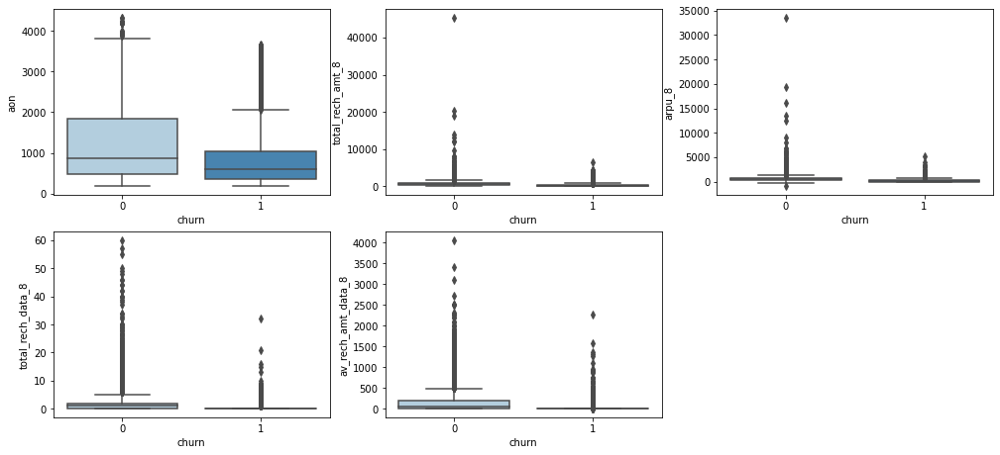

In [32]:
# Checking the churn column with a few other variables
plt.figure(figsize=(17, 20))

plt.subplot(5,3,1)
sns.boxplot(x='churn',y='aon', palette='Blues', data = telecom_high_value_customers)
plt.subplot(5,3,2)
sns.boxplot(x='churn',y='total_rech_amt_8', palette='Blues', data = telecom_high_value_customers)
plt.subplot(5,3,3)
sns.boxplot(x='churn',y='arpu_8', palette='Blues', data = telecom_high_value_customers)
plt.subplot(5,3,4)
sns.boxplot(x='churn',y='total_rech_data_8', palette='Blues', data = telecom_high_value_customers)
plt.subplot(5,3,5)
sns.boxplot(x='churn',y='av_rech_amt_data_8', palette='Blues', data = telecom_high_value_customers)

plt.show()

There seems to be outliers in these randomly selected columns, hence it is assumed there might be outliers in remaining columns as well

In [33]:
# Capping outliers
for i in telecom_high_value_customers:
    outlier_99 = telecom_high_value_customers[i].quantile(0.99)
    outlier_01 = telecom_high_value_customers[i].quantile(0.01)
    telecom_high_value_customers[i][telecom_high_value_customers[i] >= outlier_99]=outlier_99
    telecom_high_value_customers[i][telecom_high_value_customers[i] <= outlier_01]=outlier_01

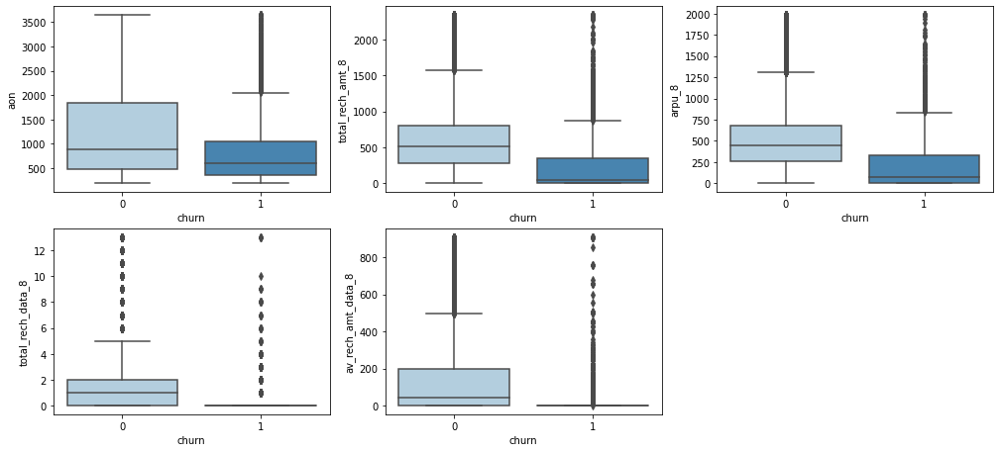

In [34]:
# Checking the churn column with a few other variables after capping
plt.figure(figsize=(17, 20))

plt.subplot(5,3,1)
sns.boxplot(x='churn',y='aon', palette='Blues', data = telecom_high_value_customers)
plt.subplot(5,3,2)
sns.boxplot(x='churn',y='total_rech_amt_8', palette='Blues', data = telecom_high_value_customers)
plt.subplot(5,3,3)
sns.boxplot(x='churn',y='arpu_8', palette='Blues', data = telecom_high_value_customers)
plt.subplot(5,3,4)
sns.boxplot(x='churn',y='total_rech_data_8', palette='Blues', data = telecom_high_value_customers)
plt.subplot(5,3,5)
sns.boxplot(x='churn',y='av_rech_amt_data_8', palette='Blues', data = telecom_high_value_customers)

plt.show()

In [35]:
# function for barplots
def bar_plot(vars_x, vars_y, figsize_x, figsize_y, sub_plot_x, sub_plot_y, color):
    plt.figure(figsize=(figsize_x, figsize_y))

    for i in vars_y:
        plt.subplot(sub_plot_x,sub_plot_y,vars_y.index(i)+1)
        sns.barplot(y = i, x=vars_x, palette=color, data = telecom_high_value_customers)

    plt.show()

In [36]:
import re
# getting all the rechrarge columns
rech_cols = [x for x in telecom_high_value_customers if re.search(".*_rech_.*", x)]
rech_cols.extend(['last_day_rch_amt_6', 'last_day_rch_amt_7', 'last_day_rch_amt_8'])
print(rech_cols)

# getting all the data usage columns
vol_cols = [x for x in telecom_high_value_customers if re.search("vol_.*", x)]
print(vol_cols)

# getting all the incoming and outgoing columns
ic_og_cols = [x for x in telecom_high_value_customers if re.search("total_og.*|total_ic.*", x)]
print(ic_og_cols)

['total_rech_num_6', 'total_rech_num_7', 'total_rech_num_8', 'total_rech_amt_8', 'max_rech_amt_6', 'max_rech_amt_7', 'max_rech_amt_8', 'total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8', 'max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8', 'av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8', 'last_day_rch_amt_6', 'last_day_rch_amt_7', 'last_day_rch_amt_8']
['vol_2g_mb_6', 'vol_2g_mb_7', 'vol_2g_mb_8', 'vol_3g_mb_6', 'vol_3g_mb_7', 'vol_3g_mb_8']
['total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8', 'total_ic_mou_6', 'total_ic_mou_7', 'total_ic_mou_8']


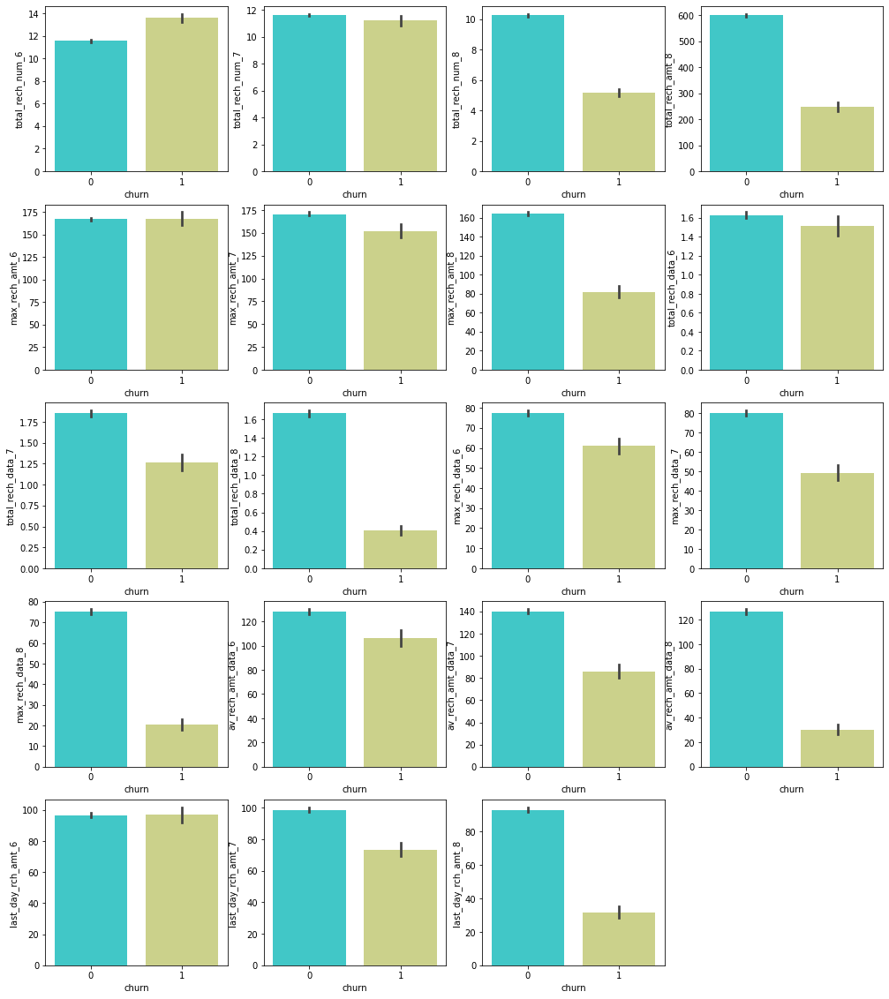

In [37]:
# Visualising all the recharge columns
bar_plot("churn", rech_cols, 17, 20, 5, 4, "rainbow")

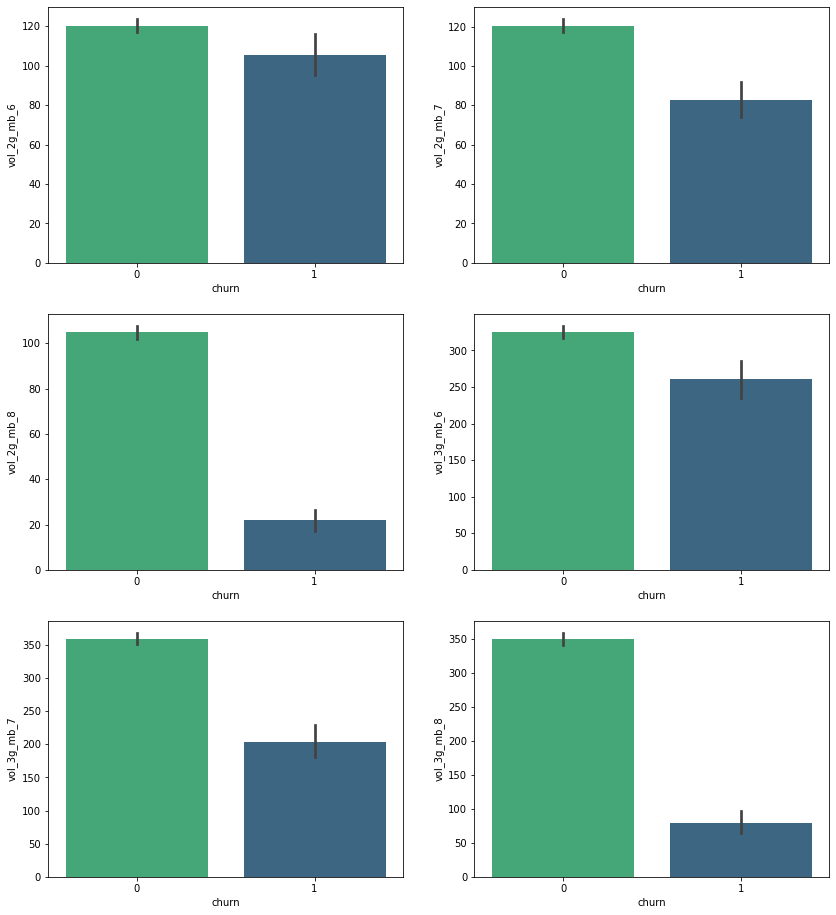

In [38]:
# Visualising all the vol_2g_3g columns
bar_plot("churn", vol_cols, 14, 16, 3, 2, "viridis_r")

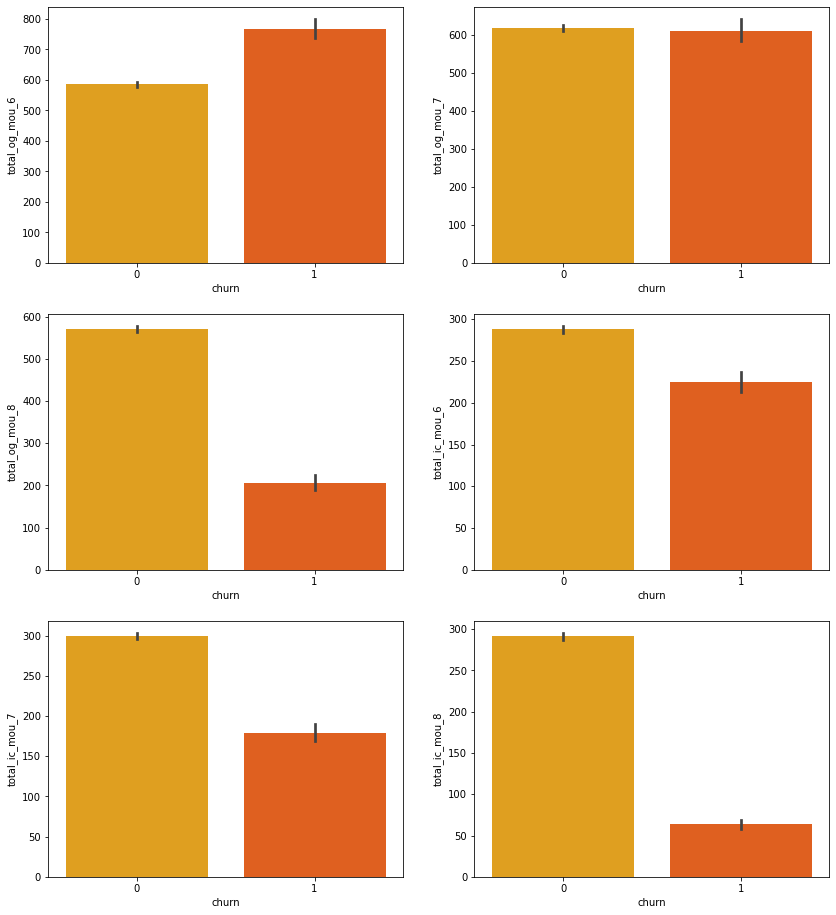

In [39]:
# Visualising all the incoming and outgoing columns
bar_plot("churn", ic_og_cols, 14, 16, 3, 2, "autumn_r")

1. In most of the cases the churned tagged users show a declining trend in recharges, internet usage and incoming call usage
2. In case of outgoing usage the churned users have higher minutes of usage in 6th and 7th months but a drastic drop in 8th month

In [40]:
telecom_high_value_customers.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,fb_user_6,fb_user_7,fb_user_8,churn
0,7000842753,197.385,214.816,213.803,34.310,32.330,0.000,96.310,91.735,0.000,0.000,0.000,0.000,0.000,0.000,0.000,11.910,11.610,0.000,41.030,40.430,0.000,0.000,0.000,0.000,0.000,0.000,0.000,65.110,63.685,0.000,0.000,0.000,0.000,3.950,3.635,0.000,0.000,0.000,0.000,11.640,11.090,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,15.690,15.740,0.160,56.490,57.080,4.130,0.880,0.930,1.150,92.160,92.550,5.440,0.000,0.000,0.000,2.030,2.040,0.000,0.000,0.000,0.000,5.890,5.960,0.000,0.000,0.000,5.440,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,4,3,2,252,252,252,252,252,252,252,1.000,1.000,1.000,252.000,252.000,252.000,252.000,252.000,252.000,30.130,1.320,5.750,83.570,150.760,109.610,0,0,0,0,0,0,1,1,1,0,0,0,968,30.400,0.000,101.200,3.580,1.000,1.000,1.000,1
7,7000701601,1069.180,1349.850,1986.622,57.840,54.680,52.290,453.430,567.160,325.910,16.230,33.490,31.640,23.740,12.590,38.060,51.390,31.380,40.280,308.630,447.380,162.280,62.130,55.140,53.230,0.000,0.000,0.000,422.160,533.910,255.790,4.300,23.290,12.010,49.890,31.760,49.140,6.660,20.080,16.680,60.860,75.140,77.840,0.000,0.180,10.010,4.500,0.000,6.500,0.000,0.000,0.000,487.530,609.240,350.160,58.140,32.260,27.310,217.560,221.490,121.190,152.160,101.460,39.530,427.880,355.230,188.040,36.890,11.830,30.390,91.440,126.990,141.330,51.380,34.240,22.210,180.540,173.080,193.940,626.460,558.040,428.740,0.210,0.000,0.000,2.060,14.530,31.590,15.740,15.190,15.140,5,5,7,2341,1000,790,951,0,0,565,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0,0,0,0,0,0,0,0,0,0,0,0,802,57.740,19.380,18.740,0.000,0.000,0.000,0.000,1
8,7001524846,378.721,492.223,137.362,413.690,351.030,35.080,94.660,80.630,136.480,0.000,0.000,0.000,0.000,0.000,0.000,297.130,217.590,12.490,80.960,70.580,50.540,0.000,0.000,0.000,0.000,0.000,7.150,378.090,288.180,63.040,116.560,133.430,22.580,13.690,10.040,75.690,0.000,0.000,0.000,130.260,143.480,98.280,0.000,0.000,0.000,0.000,0.000,10.230,0.000,0.000,0.000,508.360,431.660,171.5

### Deriving new features

In [41]:
# Deriving variables which indicate the customer behaviour difference
telecom_high_value_customers['arpu_6_7_diff'] = telecom_high_value_customers['arpu_7'] - telecom_high_value_customers['arpu_6']
telecom_high_value_customers['arpu_7_8_diff'] = telecom_high_value_customers['arpu_8'] - telecom_high_value_customers['arpu_7']
telecom_high_value_customers['total_og_mou_6_7_diff'] = telecom_high_value_customers['total_og_mou_7'] - telecom_high_value_customers['total_og_mou_6']
telecom_high_value_customers['total_og_mou_7_8_diff'] = telecom_high_value_customers['total_og_mou_8'] - telecom_high_value_customers['total_og_mou_7']
telecom_high_value_customers['total_ic_mou_6_7_diff'] = telecom_high_value_customers['total_ic_mou_7'] - telecom_high_value_customers['total_ic_mou_6']
telecom_high_value_customers['total_ic_mou_7_8_diff'] = telecom_high_value_customers['total_ic_mou_8'] - telecom_high_value_customers['total_ic_mou_7']
telecom_high_value_customers['total_rech_num_6_7_diff'] = telecom_high_value_customers['total_rech_num_7'] - telecom_high_value_customers['total_rech_num_6']
telecom_high_value_customers['total_rech_num_7_8_diff'] = telecom_high_value_customers['total_rech_num_8'] - telecom_high_value_customers['total_rech_num_7']
telecom_high_value_customers['av_rech_amt_data_6_7_diff'] = telecom_high_value_customers['av_rech_amt_data_7'] - telecom_high_value_customers['av_rech_amt_data_6']
telecom_high_value_customers['av_rech_amt_data_7_8_diff'] = telecom_high_value_customers['av_rech_amt_data_8'] - telecom_high_value_customers['av_rech_amt_data_7']
telecom_high_value_customers['tenure'] = telecom_high_value_customers['aon'] / 30

In [42]:
telecom_high_value_customers.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,fb_user_6,fb_user_7,fb_user_8,churn,arpu_6_7_diff,arpu_7_8_diff,total_og_mou_6_7_diff,total_og_mou_7_8_diff,total_ic_mou_6_7_diff,total_ic_mou_7_8_diff,total_rech_num_6_7_diff,total_rech_num_7_8_diff,av_rech_amt_data_6_7_diff,av_rech_amt_data_7_8_diff,tenure
0,7000842753,197.385,214.816,213.803,34.310,32.330,0.000,96.310,91.735,0.000,0.000,0.000,0.000,0.000,0.000,0.000,11.910,11.610,0.000,41.030,40.430,0.000,0.000,0.000,0.000,0.000,0.000,0.000,65.110,63.685,0.000,0.000,0.000,0.000,3.950,3.635,0.000,0.000,0.000,0.000,11.640,11.090,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,15.690,15.740,0.160,56.490,57.080,4.130,0.880,0.930,1.150,92.160,92.550,5.440,0.000,0.000,0.000,2.030,2.040,0.000,0.000,0.000,0.000,5.890,5.960,0.000,0.000,0.000,5.440,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,4,3,2,252,252,252,252,252,252,252,1.000,1.000,1.000,252.000,252.000,252.000,252.000,252.000,252.000,30.130,1.320,5.750,83.570,150.760,109.610,0,0,0,0,0,0,1,1,1,0,0,0,968,30.400,0.000,101.200,3.580,1.000,1.000,1.000,1,17.431,-1.013,0.000,0.000,0.000,5.440,-1,-1,0.000,0.000,32.267
7,7000701601,1069.180,1349.850,1986.622,57.840,54.680,52.290,453.430,567.160,325.910,16.230,33.490,31.640,23.740,12.590,38.060,51.390,31.380,40.280,308.630,447.380,162.280,62.130,55.140,53.230,0.000,0.000,0.000,422.160,533.910,255.790,4.300,23.290,12.010,49.890,31.760,49.140,6.660,20.080,16.680,60.860,75.140,77.840,0.000,0.180,10.010,4.500,0.000,6.500,0.000,0.000,0.000,487.530,609.240,350.160,58.140,32.260,27.310,217.560,221.490,121.190,152.160,101.460,39.530,427.880,355.230,188.040,36.890,11.830,30.390,91.440,126.990,141.330,51.380,34.240,22.210,180.540,173.080,193.940,626.460,558.040,428.740,0.210,0.000,0.000,2.060,14.530,31.590,15.740,15.190,15.140,5,5,7,2341,1000,790,951,0,0,565,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0,0,0,0,0,0,0,0,0,0,0,0,802,57.740,19.380,18.740,0.000,0.000,0.000,0.000,1,280.670,636.772,121.710,-259.080,-68.420,-129.300,0,2,0.000,0.000,26.733
8,7001524846,378.721,49

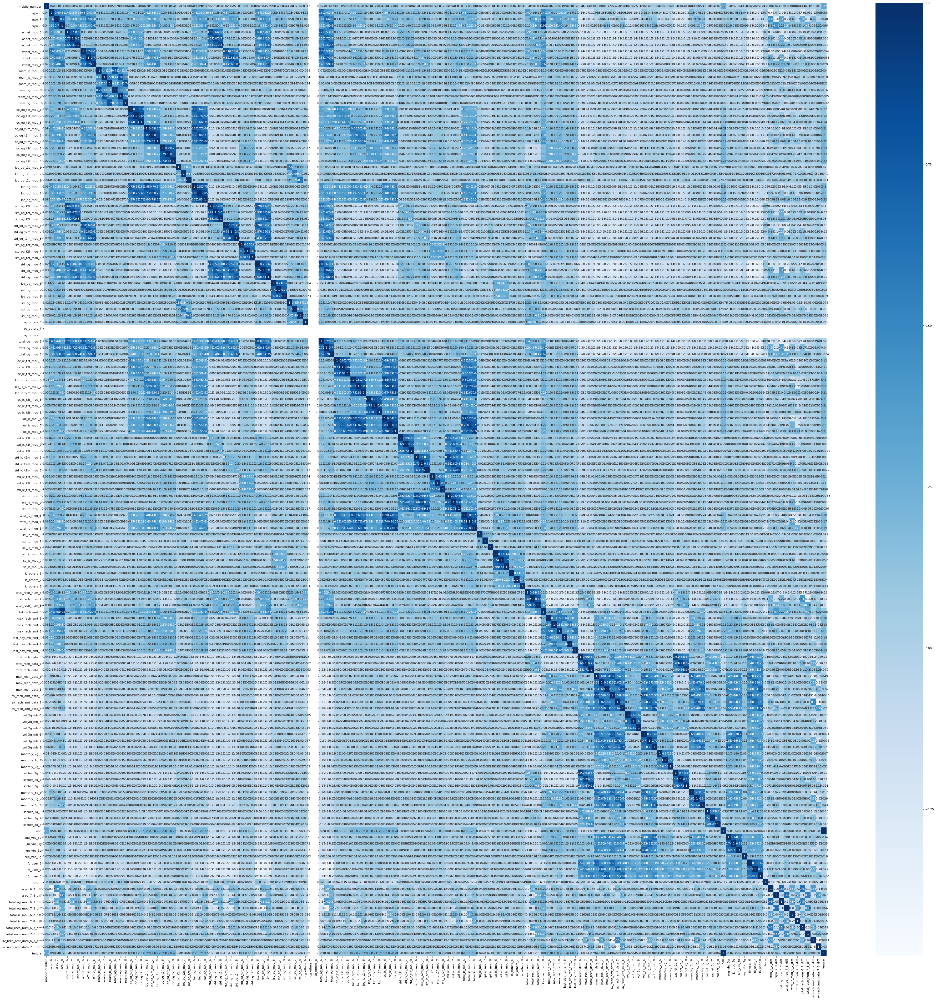

In [43]:
# Correlation map
plt.figure(figsize = (60, 60),dpi=80,facecolor='w',edgecolor='k')
sns.heatmap(telecom_high_value_customers.corr(), annot = True, cmap="Blues")
plt.show()

Given the huge data, there seems to be a few columns that are correlated. Hence a threshold of 0.75 will be selected to drop those columns

In [44]:
telecom_high_value_customers.shape

(30001, 148)

### Dropping highly correlated columns

In [45]:
# Initialising a set for columns to delete them
corr_cols = set()
# Correlation matrix
corr_matrix = telecom_high_value_customers.corr()
# Looping through the columns of corr matrix
for i in range(len(corr_matrix.columns)):
    for j in range(i):
        # Access i,j corr matrix value 
        if (corr_matrix.iloc[i,j] >= 0.75) and (corr_matrix.columns[j] not in corr_cols):
            # if > 0.8 add that column name to the initialized set
            column_name = corr_matrix.columns[i]
            corr_cols.add(column_name)
            # check for that column name in the dataset and delete
            if column_name in telecom_high_value_customers.columns:
                del telecom_high_value_customers[column_name]
                
telecom_high_value_customers.shape

(30001, 109)

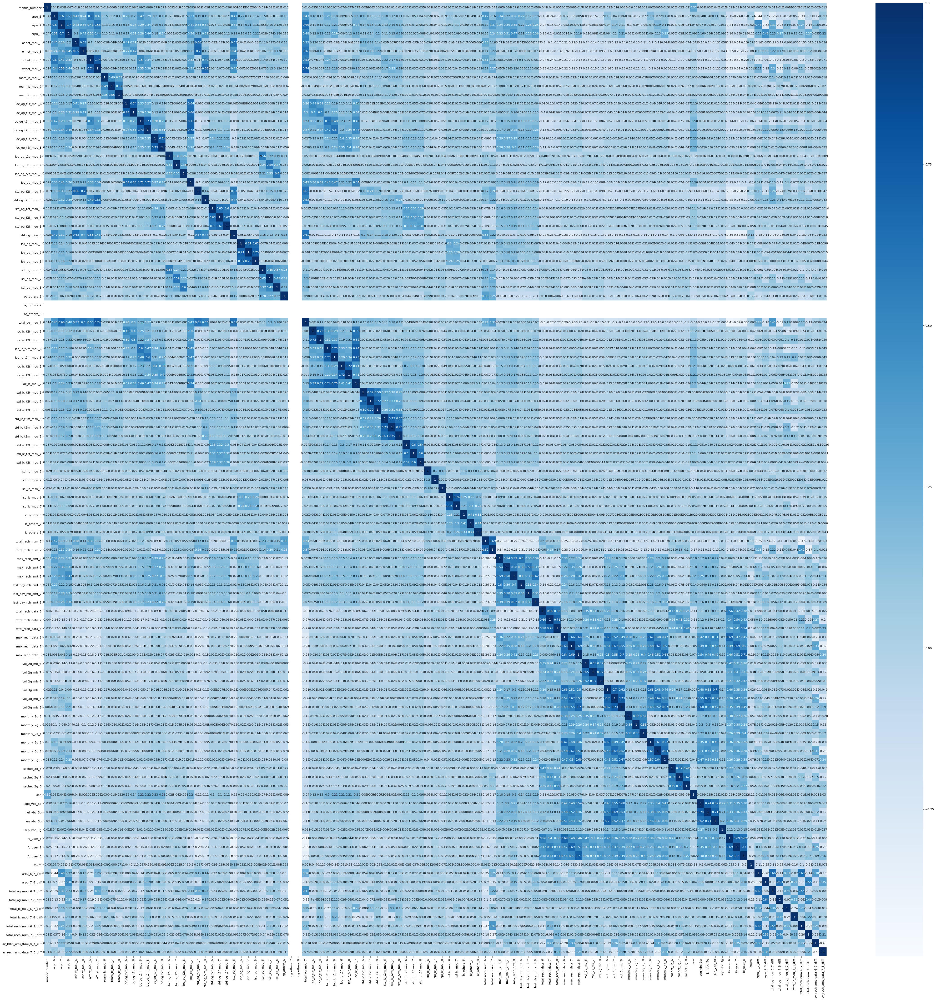

In [46]:
# Correlation map after dropping highly correlated columns
plt.figure(figsize = (60, 60),dpi=80,facecolor='w',edgecolor='k')
sns.heatmap(telecom_high_value_customers.corr(), annot = True, cmap="Blues")
plt.show()

### Modeling

In [47]:
telecom_high_value_customers.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_8,offnet_mou_6,offnet_mou_7,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_7,std_og_t2t_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_7,loc_ic_t2t_mou_6,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_8,loc_ic_mou_7,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,fb_user_6,fb_user_7,fb_user_8,churn,arpu_6_7_diff,arpu_7_8_diff,total_og_mou_6_7_diff,total_og_mou_7_8_diff,total_ic_mou_6_7_diff,total_ic_mou_7_8_diff,total_rech_num_6_7_diff,total_rech_num_7_8_diff,av_rech_amt_data_6_7_diff,av_rech_amt_data_7_8_diff
0,7000842753,197.385,214.816,213.803,34.310,0.000,96.310,91.735,0.000,0.000,0.000,11.910,0.000,41.030,0.000,0.000,0.000,0.000,0.000,0.000,63.685,0.000,0.000,0.000,0.000,0.000,11.640,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,15.690,0.160,56.490,4.130,0.880,1.150,92.550,0.000,0.000,0.000,2.030,2.040,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,4,3,252,252,252,252,252,252,1.000,1.000,1.000,252.000,252.000,252.000,30.130,1.320,5.750,83.570,150.760,109.610,0,0,0,1,1,1,0,0,0,968,30.400,0.000,101.200,3.580,1.000,1.000,1.000,1,17.431,-1.013,0.000,0.000,0.000,5.440,-1,-1,0.000,0.000
7,7000701601,1069.180,1349.850,1986.622,57.840,52.290,453.430,567.160,16.230,33.490,31.640,51.390,40.280,308.630,162.280,62.130,53.230,0.000,0.000,0.000,533.910,23.290,49.140,6.660,20.080,16.680,60.860,0.000,0.180,10.010,4.500,0.000,6.500,0.000,0.000,0.000,609.240,58.140,27.310,217.560,121.190,152.160,39.530,355.230,36.890,11.830,30.390,91.440,126.990,141.330,51.380,34.240,22.210,0.210,0.000,0.000,2.060,14.530,15.740,15.190,15.140,5,5,1000,790,951,0,0,565,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0,0,0,0,0,0,0,0,0,802,57.740,19.380,18.740,0.000,0.000,0.000,0.000,1,280.670,636.772,121.710,-259.080,-68.420,-129.300,0,2,0.000,0.000
8,7001524846,378.721,492.223,137.362,413.690,35.080,94.660,80.630,0.000,0.000,0.000,297.130,12.490,80.960,50.540,0.000,0.000,0.000,0.000,7.150,288.180,133.430,75.690,0.000,0.000,0.000,130.260,0.000,0.000,0.000,0.000,0.000,10.230,0.000,0.000,0.000,431.660,23.840,0.310,57.580,15.480,0.000,0.000,23.830,0.000,0.580,0.100,22.430,4.080,0.650,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,19,21,90,154,30,50,0,10,0.000,2.000,3.000,0.000,154.000,23.000,0.000,356.000,0.030,0.000,750.950,11.940,0,1,0,0,0,0,0,0,0,315,21.030,910.650,122.160,0.000,0.000,1.000,1.000,0,113.502,-354.861,-76.700,-260.100,-75.370,-11.950,2,-7,177.000,-108.000
21,7002124215,514.453,597.753,637.760,102.410,85.140,757.930,896.680,0.000,0.000,0.000,4.480,23.340,91.810,104.810,0.750,1.580,0.000,0.000,0.000,94.090,125.940,876.990,0.000,0.000,0.000,763.290,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1028.790,2.480,19.540,118.230,129.160,4.610,10.390,87.680,14.060,5.980,0.180,67.690,38.230,101.740,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,22,26,50,50,50,30,20,50,0.000

### Data preparation

In [48]:
# Test-Train split
from sklearn.model_selection import train_test_split

In [49]:
# X features
X = telecom_high_value_customers.drop('churn', axis=1)
X.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_8,offnet_mou_6,offnet_mou_7,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_7,std_og_t2t_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_7,loc_ic_t2t_mou_6,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_8,loc_ic_mou_7,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,fb_user_6,fb_user_7,fb_user_8,arpu_6_7_diff,arpu_7_8_diff,total_og_mou_6_7_diff,total_og_mou_7_8_diff,total_ic_mou_6_7_diff,total_ic_mou_7_8_diff,total_rech_num_6_7_diff,total_rech_num_7_8_diff,av_rech_amt_data_6_7_diff,av_rech_amt_data_7_8_diff
0,7000842753,197.385,214.816,213.803,34.310,0.000,96.310,91.735,0.000,0.000,0.000,11.910,0.000,41.030,0.000,0.000,0.000,0.000,0.000,0.000,63.685,0.000,0.000,0.000,0.000,0.000,11.640,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,15.690,0.160,56.490,4.130,0.880,1.150,92.550,0.000,0.000,0.000,2.030,2.040,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,4,3,252,252,252,252,252,252,1.000,1.000,1.000,252.000,252.000,252.000,30.130,1.320,5.750,83.570,150.760,109.610,0,0,0,1,1,1,0,0,0,968,30.400,0.000,101.200,3.580,1.000,1.000,1.000,17.431,-1.013,0.000,0.000,0.000,5.440,-1,-1,0.000,0.000
7,7000701601,1069.180,1349.850,1986.622,57.840,52.290,453.430,567.160,16.230,33.490,31.640,51.390,40.280,308.630,162.280,62.130,53.230,0.000,0.000,0.000,533.910,23.290,49.140,6.660,20.080,16.680,60.860,0.000,0.180,10.010,4.500,0.000,6.500,0.000,0.000,0.000,609.240,58.140,27.310,217.560,121.190,152.160,39.530,355.230,36.890,11.830,30.390,91.440,126.990,141.330,51.380,34.240,22.210,0.210,0.000,0.000,2.060,14.530,15.740,15.190,15.140,5,5,1000,790,951,0,0,565,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0,0,0,0,0,0,0,0,0,802,57.740,19.380,18.740,0.000,0.000,0.000,0.000,280.670,636.772,121.710,-259.080,-68.420,-129.300,0,2,0.000,0.000
8,7001524846,378.721,492.223,137.362,413.690,35.080,94.660,80.630,0.000,0.000,0.000,297.130,12.490,80.960,50.540,0.000,0.000,0.000,0.000,7.150,288.180,133.430,75.690,0.000,0.000,0.000,130.260,0.000,0.000,0.000,0.000,0.000,10.230,0.000,0.000,0.000,431.660,23.840,0.310,57.580,15.480,0.000,0.000,23.830,0.000,0.580,0.100,22.430,4.080,0.650,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,19,21,90,154,30,50,0,10,0.000,2.000,3.000,0.000,154.000,23.000,0.000,356.000,0.030,0.000,750.950,11.940,0,1,0,0,0,0,0,0,0,315,21.030,910.650,122.160,0.000,0.000,1.000,1.000,113.502,-354.861,-76.700,-260.100,-75.370,-11.950,2,-7,177.000,-108.000
21,7002124215,514.453,597.753,637.760,102.410,85.140,757.930,896.680,0.000,0.000,0.000,4.480,23.340,91.810,104.810,0.750,1.580,0.000,0.000,0.000,94.090,125.940,876.990,0.000,0.000,0.000,763.290,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1028.790,2.480,19.540,118.230,129.160,4.610,10.390,87.680,14.060,5.980,0.180,67.690,38.230,101.740,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,22,26,50,50,50,30,20,50,0.000,0.000,0.000

In [50]:
# y target
y = telecom_high_value_customers['churn']
y.head()

0     1
7     1
8     0
21    0
23    0
Name: churn, dtype: int64

In [51]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.7, random_state = 0, stratify = y)

In [52]:
# Checking the split data
print("X_train: ", X_train.shape)
print("X_test: ", X_test.shape)
print("y_train: ", y_train.shape)
print("y_test: ", y_test.shape)

X_train:  (21000, 108)
X_test:  (9001, 108)
y_train:  (21000,)
y_test:  (9001,)


In [53]:
# Scaling
cols = telecom_high_value_customers.drop('churn',axis=1).columns
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train[cols] = scaler.fit_transform(X_train[cols])
X_train.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_8,offnet_mou_6,offnet_mou_7,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_7,std_og_t2t_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_7,loc_ic_t2t_mou_6,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_8,loc_ic_mou_7,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,fb_user_6,fb_user_7,fb_user_8,arpu_6_7_diff,arpu_7_8_diff,total_og_mou_6_7_diff,total_og_mou_7_8_diff,total_ic_mou_6_7_diff,total_ic_mou_7_8_diff,total_rech_num_6_7_diff,total_rech_num_7_8_diff,av_rech_amt_data_6_7_diff,av_rech_amt_data_7_8_diff
33872,1.469,-0.855,-0.890,-0.934,-0.629,-0.581,-0.728,-0.824,-0.277,-0.249,-0.252,-0.512,-0.513,-0.496,-0.721,-0.408,-0.406,-0.338,-0.347,0.605,-0.749,-0.459,-0.455,-0.240,-0.239,-0.234,-0.612,-0.161,-0.160,-0.152,-0.469,-0.499,-0.142,-0.379,0.000,0.000,-0.929,-0.611,-0.408,-0.596,-0.654,-0.449,-0.428,-0.758,-0.384,-0.380,-0.365,-0.461,-0.456,-0.446,-0.278,-0.279,-0.284,1.593,-0.224,3.394,-0.193,-0.260,-0.256,-0.254,-0.254,-0.326,0.512,-0.499,-0.504,-0.907,-0.676,-0.638,-0.819,0.939,3.336,3.687,0.160,0.137,-0.454,-0.440,-0.432,-0.399,0.192,0.512,0.388,-0.403,-0.410,-0.382,-0.380,-0.384,-0.370,6.407,6.784,6.326,-0.779,-0.450,-0.448,-0.430,-0.218,0.974,0.959,1.050,-0.050,-0.123,-0.123,0.177,-0.107,0.190,1.063,-0.211,1.108,-0.329
79576,-0.911,-0.377,-0.194,0.152,-0.372,-0.528,-0.431,-0.613,0.516,-0.249,-0.252,0.090,-0.427,-0.173,-0.405,-0.284,-0.215,-0.338,-0.347,-0.338,-0.494,-0.425,-0.379,3.517,0.375,1.503,-0.505,-0.161,-0.160,-0.152,-0.469,0.750,-0.491,-0.379,0.000,0.000,-0.736,0.296,-0.128,-0.459,-0.441,-0.296,-0.420,-0.445,-0.384,-0.172,-0.114,0.567,0.280,1.492,2.055,0.296,2.524,-0.431,-0.224,-0.265,-0.254,-0.077,-0.256,-0.254,-0.254,-0.797,-0.768,-0.256,0.536,0.646,0.286,-0.862,1.526,-0.639,-0.292,-0.219,-0.750,1.730,1.819,-0.440,-0.252,-0.234,-0.475,0.255,0.402,-0.403,-0.410,-0.382,-0.380,1.387,1.476,-0.289,-0.275,-0.260,-0.206,0.697,0.548,-0.430,-0.218,-1.026,0.959,1.050,0.201,0.444,-0.312,0.151,-0.344,0.491,0.024,0.456,1.542,0.116
16016,0.891,-0.261,-0.035,-0.214,1.189,2.043,-0.620,-0.771,-0.277,-0.249,-0.252,-0.493,-0.498,-0.722,-0.711,-0.408,-0.406,0.088,1.408,-0.338,-0.764,2.941,-0.449,-0.240,-0.239,-0.234,0.704,-0.161,-0.160,-0.152,5.629,1.617,-0.439,-0.379,0.000,0.000,0.991,-0.575,-0.597,-0.808,-0.787,-0.449,-0.446,-0.838,0.360,0.347,0.683,-0.461,-0.456,-0.446,-0.278,-0.279,-0.284,-0.431,-0.224,-0.265,-0.254,-0.260,-0.256,-0.254,-0.254,-0.090,-0.070,-0.374,-0.265,-0.189,0.123,0.285,0.390,-0.639,-0.655,-0.609,-0.750,-0.764,-0.705,-0.440,-0.432,-0.399,-0.475,-0.489,-0.471,-0.403,-0.410,-0.382,-0.380,-0.384,-0.370,-0.289,-0.275,-0.260,-1.058,-0.450,-0.448,-0.430,-0.218,-1.026,-1.043,-0.952,0.250,-0.240,0.849,-0.371,-0.023,0.122,0.024,-0.711,-0.066,0.116
54470,0.309,0.028,0.638,0.076,-0.510,-0.551,-0.501,0.259,-0.277,6.899,-0.252,-0.194,-0.427,-0.320,-0.403,2.200,2.162,-0.338,-0.347,-0.338,-0.222,-0.459,-0.377,1.716,7.177,3.944,-0.586,-0.161,-

### Model building - Logistic regression with RFE (without PCA)

In [54]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression(class_weight = 'balanced', random_state = 0)

In [55]:
from sklearn.feature_selection import RFE
# Running RFE with 15 variables as output
rfe = RFE(logreg, 15)
rfe = rfe.fit(X_train, y_train)

In [56]:
rfe.support_

array([False, False, False,  True,  True, False,  True, False, False,
       False, False, False, False, False,  True, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
        True, False,  True, False,  True, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False,  True,
       False, False, False, False, False,  True, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True, False, False,  True, False,
       False,  True,  True, False, False, False,  True, False, False])

In [57]:
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('mobile_number', False, 91),
 ('arpu_6', False, 19),
 ('arpu_7', False, 31),
 ('arpu_8', True, 1),
 ('onnet_mou_6', True, 1),
 ('onnet_mou_8', False, 38),
 ('offnet_mou_6', True, 1),
 ('offnet_mou_7', False, 50),
 ('roam_ic_mou_6', False, 48),
 ('roam_ic_mou_7', False, 21),
 ('roam_ic_mou_8', False, 67),
 ('loc_og_t2t_mou_6', False, 68),
 ('loc_og_t2t_mou_8', False, 15),
 ('loc_og_t2m_mou_6', False, 13),
 ('loc_og_t2m_mou_8', True, 1),
 ('loc_og_t2f_mou_6', False, 22),
 ('loc_og_t2f_mou_8', False, 79),
 ('loc_og_t2c_mou_6', False, 58),
 ('loc_og_t2c_mou_7', False, 45),
 ('loc_og_t2c_mou_8', False, 30),
 ('loc_og_mou_7', False, 14),
 ('std_og_t2t_mou_7', False, 28),
 ('std_og_t2m_mou_8', False, 39),
 ('std_og_t2f_mou_6', False, 73),
 ('std_og_t2f_mou_7', False, 49),
 ('std_og_t2f_mou_8', False, 8),
 ('std_og_mou_6', False, 44),
 ('isd_og_mou_6', False, 87),
 ('isd_og_mou_7', False, 65),
 ('isd_og_mou_8', False, 86),
 ('spl_og_mou_6', False, 59),
 ('spl_og_mou_7', False, 46),
 ('spl_og

In [58]:
feature_col = X_train.columns[rfe.support_]
feature_col

Index(['arpu_8', 'onnet_mou_6', 'offnet_mou_6', 'loc_og_t2m_mou_8', 'total_og_mou_7', 'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_8', 'spl_ic_mou_8', 'total_rech_num_7', 'last_day_rch_amt_8', 'sep_vbc_3g', 'fb_user_8', 'total_og_mou_6_7_diff', 'total_og_mou_7_8_diff', 'total_rech_num_7_8_diff'], dtype='object')

### Model I

In [59]:
# Assessing the model with StatsModels
import statsmodels.api as sm
X_train_sm = sm.add_constant(X_train[feature_col])
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                21000
Model:                            GLM   Df Residuals:                    20984
Model Family:                Binomial   Df Model:                           15
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4013.6
Date:                Mon, 31 Aug 2020   Deviance:                       8027.1
Time:                        12:09:54   Pearson chi2:                 6.45e+05
No. Iterations:                    10                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                      -4.0523      0.085    -47.712      0.000      -4.219      -3.886
arpu_8                      0.3315      0.058      5.711      0.000       0.218       0.445
onnet_mou_6                 0.5380      0.073      7.331      0.000       0.394       0.682
offnet_mou_6                0.6062      0.076      7.935      0.000       0.457       0.756
loc_og_t2m_mou_8           -0.4393      0.093     -4.719      0.000      -0.622      -0.257
total_og_mou_7             -1.4943      0.123    -12.162      0.000      -1.735      -1.253
loc_ic_t2t_mou_8           -0.4593      0.087     -5.275      0.000      -0.630      -0.289
loc_ic_t2m_mou_8           -0.6211      0.094     -6.613      0.000      -0.805      -0.437
spl_ic_mou_8               -0.6414      0.092     -6.972      0.000      -0.822      -0.461
total_rech_num_7           -0.6199      0.059    -10.567      0.000      -0.735      -0.505
last_day_rch_amt_8         -0.6734      0.054    -12.539      0.000      -0.779      -0.568
sep_vbc_3g                 -1.2995      0.287     -4.535      0.000      -1.861      -0.738
fb_user_8                  -0.7725      0.041    -19.050      0.000      -0.852      -0.693
total_og_mou_6_7_diff       0.4281      0.082      5.208      0.000       0.267       0.589
total_og_mou_7_8_diff      -0.6492      0.053    -12.185      0.000      -0.754      -0.545
total_rech_num_7_8_diff    -0.6605      0.050    -13.084      0.000      -0.759      -0.562
===========================================================================================
"""

In [60]:
# Getting the predicted values on the train set
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

33872   0.005
79576   0.013
16016   0.098
54470   0.000
40020   0.025
22850   0.031
30919   0.003
79022   0.000
34040   0.102
77563   0.031
dtype: float64

In [61]:
y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([4.76328465e-03, 1.34434435e-02, 9.76791231e-02, 1.10271390e-05,
       2.51267980e-02, 3.05494504e-02, 2.62843675e-03, 2.06858035e-04,
       1.02140681e-01, 3.10269683e-02])

Checking the churn probabilities

In [62]:
y_train_pred_final = pd.DataFrame({'Churn':y_train.values, 'Churn_Prob':y_train_pred})
y_train_pred_final['CustID'] = y_train.index
y_train_pred_final.head(10)

,Churn,Churn_Prob,CustID
0,0,0.005,33872
1,0,0.013,79576
2,0,0.098,16016
3,0,0.000,54470
4,0,0.025,40020
5,0,0.031,22850
6,0,0.003,30919
7,0,0.000,79022
8,0,0.102,34040
9,0,0.031,77563


In [63]:
y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)

# Let's see the head
y_train_pred_final.head()

,Churn,Churn_Prob,CustID,predicted
0,0,0.005,33872,0
1,0,0.013,79576,0
2,0,0.098,16016,0
3,0,0.000,54470,0
4,0,0.025,40020,0


### VIF (Variance Inflation Factor)

In [64]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Creating a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[feature_col].columns
vif['VIF'] = [variance_inflation_factor(X_train[feature_col].values, i) for i in range(X_train[feature_col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
4,total_og_mou_7,24.230
12,total_og_mou_6_7_diff,12.680
2,offnet_mou_6,11.120
1,onnet_mou_6,10.240
0,arpu_8,2.880
3,loc_og_t2m_mou_8,2.030
13,total_og_mou_7_8_diff,2.010
6,loc_ic_t2m_mou_8,1.730
8,total_rech_num_7,1.720
14,total_rech_num_7_8_diff,1.690


Few variables have high VIF which should be dropped

In [65]:
feature_col = feature_col.drop('total_og_mou_6_7_diff', 1)
feature_col

Index(['arpu_8', 'onnet_mou_6', 'offnet_mou_6', 'loc_og_t2m_mou_8', 'total_og_mou_7', 'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_8', 'spl_ic_mou_8', 'total_rech_num_7', 'last_day_rch_amt_8', 'sep_vbc_3g', 'fb_user_8', 'total_og_mou_7_8_diff', 'total_rech_num_7_8_diff'], dtype='object')

### Model II

In [66]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[feature_col])
logm3 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm3.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                21000
Model:                            GLM   Df Residuals:                    20985
Model Family:                Binomial   Df Model:                           14
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4026.8
Date:                Mon, 31 Aug 2020   Deviance:                       8053.7
Time:                        12:09:55   Pearson chi2:                 6.99e+05
No. Iterations:                    10                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                      -4.0544      0.085    -47.509      0.000      -4.222      -3.887
arpu_8                      0.3912      0.056      6.976      0.000       0.281       0.501
onnet_mou_6                 0.1885      0.030      6.230      0.000       0.129       0.248
offnet_mou_6                0.2408      0.031      7.803      0.000       0.180       0.301
loc_og_t2m_mou_8           -0.4585      0.093     -4.910      0.000      -0.642      -0.275
total_og_mou_7             -0.9882      0.075    -13.241      0.000      -1.134      -0.842
loc_ic_t2t_mou_8           -0.4573      0.087     -5.277      0.000      -0.627      -0.287
loc_ic_t2m_mou_8           -0.6289      0.094     -6.676      0.000      -0.814      -0.444
spl_ic_mou_8               -0.6454      0.092     -7.014      0.000      -0.826      -0.465
total_rech_num_7           -0.6180      0.058    -10.618      0.000      -0.732      -0.504
last_day_rch_amt_8         -0.6644      0.053    -12.474      0.000      -0.769      -0.560
sep_vbc_3g                 -1.3305      0.289     -4.610      0.000      -1.896      -0.765
fb_user_8                  -0.7931      0.040    -19.635      0.000      -0.872      -0.714
total_og_mou_7_8_diff      -0.6691      0.053    -12.585      0.000      -0.773      -0.565
total_rech_num_7_8_diff    -0.6614      0.050    -13.157      0.000      -0.760      -0.563
===========================================================================================
"""

In [67]:
y_train_pred = res.predict(X_train_sm).values.reshape(-1)
y_train_pred[:10]

array([4.71716158e-03, 1.42817276e-02, 9.69420543e-02, 9.42750132e-06,
       2.57226198e-02, 3.08654437e-02, 2.69197289e-03, 1.75248348e-04,
       1.01023527e-01, 3.09668360e-02])

In [68]:
y_train_pred_final['Churn_Prob'] = y_train_pred

In [69]:
# Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0
y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Churn,Churn_Prob,CustID,predicted
0,0,0.005,33872,0
1,0,0.014,79576,0
2,0,0.097,16016,0
3,0,0.000,54470,0
4,0,0.026,40020,0


In [70]:
vif = pd.DataFrame()
vif['Features'] = X_train[feature_col].columns
vif['VIF'] = [variance_inflation_factor(X_train[feature_col].values, i) for i in range(X_train[feature_col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
4,total_og_mou_7,3.700
0,arpu_8,2.830
3,loc_og_t2m_mou_8,2.030
12,total_og_mou_7_8_diff,2.010
6,loc_ic_t2m_mou_8,1.730
8,total_rech_num_7,1.720
13,total_rech_num_7_8_diff,1.690
2,offnet_mou_6,1.620
1,onnet_mou_6,1.590
9,last_day_rch_amt_8,1.400


The VIF's of all the variables are below 5 which is good indication

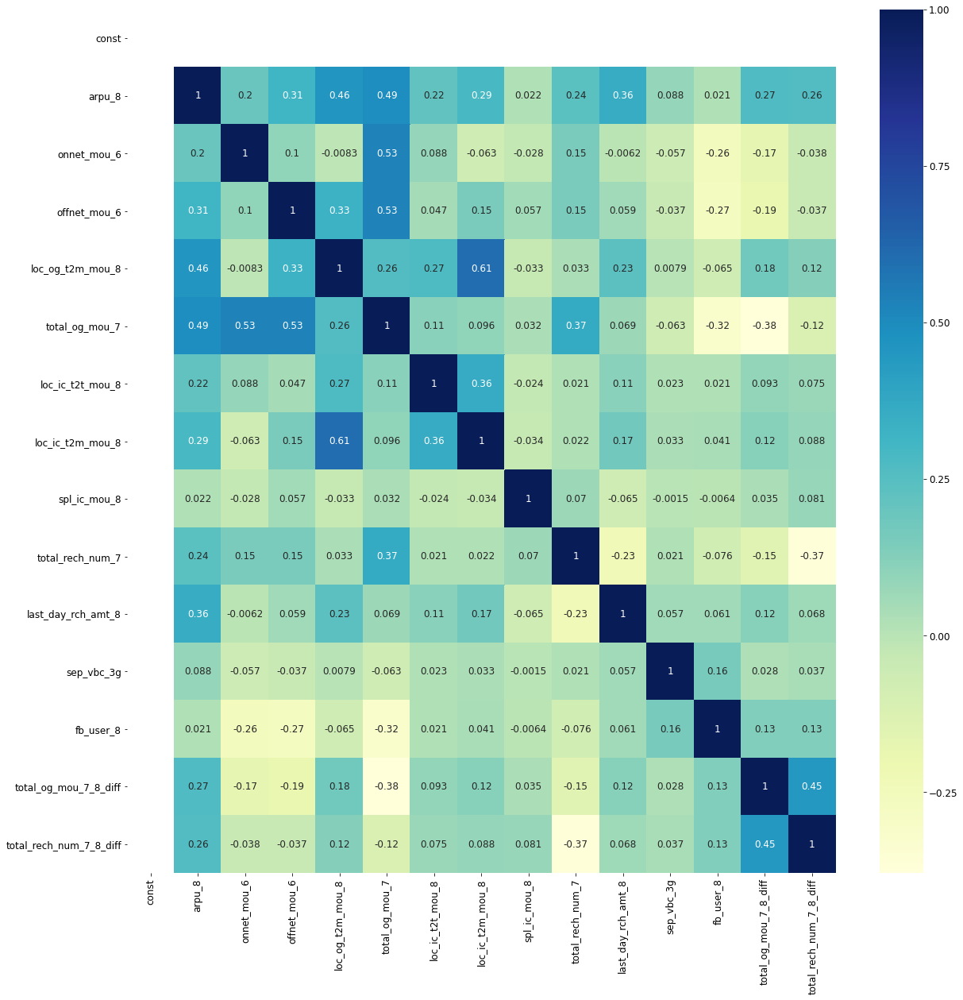

In [71]:
# Let's see the correlation of our data
plt.rcParams['font.size'] = 12
fig, ax = plt.subplots(figsize = (20, 20))
sns.heatmap(X_train_sm.corr(), annot = True, cmap = "YlGnBu")
plt.show()

### Plotting ROC curve - tells the tradeoff between sensitivity and specificity

In [72]:
from sklearn import metrics

In [73]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [74]:
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_final.Churn, y_train_pred_final.Churn_Prob, drop_intermediate = False )

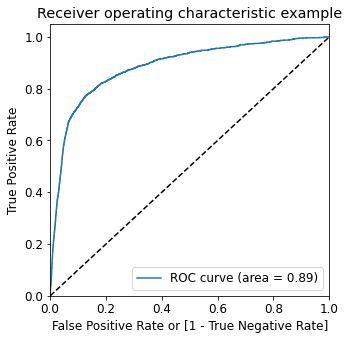

In [75]:
draw_roc(y_train_pred_final.Churn, y_train_pred_final.Churn_Prob)

### Finding optimal cut off  point - for balanced sensitivity and specificity

In [76]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,Churn,Churn_Prob,CustID,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.005,33872,0,1,0,0,0,0,0,0,0,0,0
1,0,0.014,79576,0,1,0,0,0,0,0,0,0,0,0
2,0,0.097,16016,0,1,0,0,0,0,0,0,0,0,0
3,0,0.000,54470,0,1,0,0,0,0,0,0,0,0,0
4,0,0.026,40020,0,1,0,0,0,0,0,0,0,0,0


In [77]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['probability','accuracy','sensitivity','specificity'])
from sklearn.metrics import confusion_matrix

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    specificity = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensitivity = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensitivity,specificity]
    
print(cutoff_df)

       probability  accuracy  sensitivity  specificity
0.000        0.000     0.081        1.000        0.000
0.100        0.100     0.840        0.795        0.844
0.200        0.200     0.901        0.702        0.919
0.300        0.300     0.921        0.582        0.951
0.400        0.400     0.925        0.365        0.975
0.500        0.500     0.925        0.207        0.988
0.600        0.600     0.922        0.099        0.995
0.700        0.700     0.920        0.039        0.998
0.800        0.800     0.919        0.015        1.000
0.900        0.900     0.919        0.001        1.000


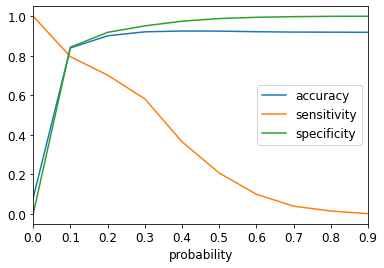

In [78]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='probability', y=['accuracy','sensitivity','specificity'])
plt.show()

From the graph the cut off point can be taken as 0.1

In [79]:
# Adding the final predicted column to the probability df with 0.1
y_train_pred_final['final_predicted'] = y_train_pred_final.Churn_Prob.map( lambda x: 1 if x > 0.1 else 0)

y_train_pred_final.head()

,Churn,Churn_Prob,CustID,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,0,0.005,33872,0,1,0,0,0,0,0,0,0,0,0,0
1,0,0.014,79576,0,1,0,0,0,0,0,0,0,0,0,0
2,0,0.097,16016,0,1,0,0,0,0,0,0,0,0,0,0
3,0,0.000,54470,0,1,0,0,0,0,0,0,0,0,0,0
4,0,0.026,40020,0,1,0,0,0,0,0,0,0,0,0,0


### Checking the metrics and confusion matrix

In [80]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.final_predicted)

0.8396666666666667

In [81]:
confusion2 = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final.final_predicted )
confusion2

array([[16274,  3017],
       [  350,  1359]], dtype=int64)

In [82]:
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [83]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.7952018724400234

In [84]:
# Let us calculate specificity
TN / float(TN+FP)

0.8436058265512415

In [85]:
# Calculate false postive rate - predicting churn when customer does not have churned
print(FP/ float(TN+FP))

0.1563941734487585


In [86]:
# Positive predictive value 
print (TP / float(TP+FP))

0.31055758683729434


In [87]:
# Negative predictive value
print (TN / float(TN+ FN))

0.9789461020211742


### Precision and Recall

In [88]:
from sklearn.metrics import precision_recall_curve
y_train_pred_final.Churn, y_train_pred_final.predicted

(0        0
 1        0
 2        0
 3        0
 4        0
         ..
 20995    0
 20996    0
 20997    0
 20998    0
 20999    1
 Name: Churn, Length: 21000, dtype: int64, 0        0
 1        0
 2        0
 3        0
 4        0
         ..
 20995    0
 20996    0
 20997    0
 20998    0
 20999    0
 Name: predicted, Length: 21000, dtype: int64)

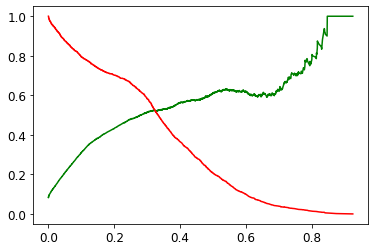

In [89]:
p, r, thresholds = precision_recall_curve(y_train_pred_final.Churn, y_train_pred_final.Churn_Prob)
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

From the graph 0.35 can be seen as the precision recall tradeoff value

In [90]:
# Adding the precision predicted column to the probability df with 0.35
y_train_pred_final['precision_predicted'] = y_train_pred_final.Churn_Prob.map( lambda x: 1 if x > 0.35 else 0)

y_train_pred_final.head()

,Churn,Churn_Prob,CustID,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted,precision_predicted
0,0,0.005,33872,0,1,0,0,0,0,0,0,0,0,0,0,0
1,0,0.014,79576,0,1,0,0,0,0,0,0,0,0,0,0,0
2,0,0.097,16016,0,1,0,0,0,0,0,0,0,0,0,0,0
3,0,0.000,54470,0,1,0,0,0,0,0,0,0,0,0,0,0
4,0,0.026,40020,0,1,0,0,0,0,0,0,0,0,0,0,0


### Metrics after precision recall

In [91]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.precision_predicted)

0.9228571428571428

In [92]:
confusion3 = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final.precision_predicted )
confusion3

array([[18597,   694],
       [  926,   783]], dtype=int64)

In [93]:
TP = confusion3[1,1] # true positive 
TN = confusion3[0,0] # true negatives
FP = confusion3[0,1] # false positives
FN = confusion3[1,0] # false negatives

In [94]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.45816266822703333

In [95]:
# Let us calculate specificity
TN / float(TN+FP)

0.9640246747187807

In [184]:
# Let us calculate Precision
precision = TP / float(TP+FP)
precision

0.26141278231619414

In [185]:
# Let us calculate Recall
recall = TP / float(TP+FN)
recall

0.7431693989071039

#### Metrics on train set - Logistic regression without PCA 
- Accuracy - 92.2%
- Sensitivity - 45.8%
- Specificity - 96.4%
- Precision - 29.6
- Recall - 74.3%

### Test set predictions

In [99]:
# cols = all the columns from the dataset except churn (target)
X_test[cols] = scaler.transform(X_test[cols])
X_test.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_8,offnet_mou_6,offnet_mou_7,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_7,std_og_t2t_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_7,loc_ic_t2t_mou_6,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_8,loc_ic_mou_7,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,fb_user_6,fb_user_7,fb_user_8,arpu_6_7_diff,arpu_7_8_diff,total_og_mou_6_7_diff,total_og_mou_7_8_diff,total_ic_mou_6_7_diff,total_ic_mou_7_8_diff,total_rech_num_6_7_diff,total_rech_num_7_8_diff,av_rech_amt_data_6_7_diff,av_rech_amt_data_7_8_diff
78442,0.543,0.456,0.049,-0.390,-0.540,-0.547,2.028,1.371,-0.277,-0.249,-0.252,-0.289,-0.414,0.985,-0.128,-0.382,-0.406,-0.338,-0.347,-0.338,0.042,-0.459,0.626,-0.103,-0.239,-0.234,0.971,-0.161,-0.160,-0.152,-0.469,-0.499,-0.491,-0.379,0.000,0.000,0.589,-0.180,-0.074,0.271,0.013,-0.235,-0.446,-0.203,-0.302,-0.380,-0.337,-0.370,-0.417,-0.286,-0.278,-0.279,-0.284,-0.431,-0.224,-0.265,-0.254,-0.260,-0.256,-0.254,-0.254,0.028,0.047,-0.374,-0.381,-0.620,-0.268,-0.414,-0.633,-0.639,-0.655,-0.609,-0.750,-0.764,-0.705,-0.440,-0.432,-0.399,-0.475,-0.489,-0.471,-0.403,-0.410,-0.382,-0.380,-0.384,-0.370,-0.289,-0.275,-0.260,1.750,-0.450,-0.448,-0.430,-0.218,-1.026,-1.043,-0.952,-0.450,-0.578,-0.600,-1.043,-0.414,0.236,0.024,1.457,-0.066,0.116
70032,0.788,-1.306,-1.345,-1.304,-0.629,-0.499,-0.838,-0.842,-0.277,-0.249,-0.252,-0.512,-0.427,-0.732,-0.534,-0.408,-0.406,0.221,-0.347,-0.338,-0.773,-0.459,-0.445,-0.240,-0.239,-0.234,-0.612,-0.161,-0.160,-0.152,0.161,-0.499,-0.491,-0.379,0.000,0.000,-0.941,-0.611,-0.429,-0.762,-0.481,-0.449,-0.415,-0.823,-0.020,-0.380,-0.365,-0.461,-0.456,-0.408,-0.278,-0.279,-0.284,-0.431,-0.224,-0.265,-0.204,-0.170,-0.256,-0.254,-0.254,-1.151,-0.535,-0.453,-0.931,-1.078,0.014,-0.638,-0.819,-0.245,1.522,-0.609,0.230,-0.516,-0.705,0.500,0.096,-0.399,-0.475,-0.489,-0.471,-0.403,-0.410,-0.382,-0.380,-0.384,-0.370,-0.289,-0.275,-0.260,-0.681,-0.450,-0.448,-0.430,-0.218,0.974,0.959,-0.952,-0.061,-0.043,-0.052,0.180,-0.082,0.017,0.766,-0.878,0.266,-0.896
64996,0.414,-0.066,-0.248,-0.260,-0.272,0.045,-0.164,0.247,0.195,-0.249,-0.252,0.076,1.281,-0.485,0.431,-0.408,-0.347,-0.338,3.242,-0.338,0.117,-0.445,0.823,-0.240,-0.239,-0.234,-0.183,-0.161,-0.160,-0.152,-0.469,0.828,-0.491,0.074,0.000,0.000,0.044,0.811,-0.003,-0.244,0.275,-0.368,-0.158,1.195,0.690,-0.359,-0.365,-0.188,-0.059,-0.029,-0.278,-0.279,-0.284,-0.431,-0.224,-0.265,-0.254,0.839,1.956,0.366,0.518,0.146,1.443,0.217,-0.381,-0.052,0.023,0.124,0.390,-0.639,0.071,-0.609,-0.750,-0.516,-0.705,-0.440,-0.283,-0.399,-0.475,-0.489,-0.471,-0.403,-0.410,-0.382,-0.380,-0.384,-0.370,-0.289,-0.275,-0.260,1.869,-0.450,-0.448,-0.430,-0.218,-1.026,0.959,-0.952,-0.205,-0.035,0.508,0.770,1.586,-1.635,1.656,-1.711,0.253,-0.221
67754,-1.104,2.156,3.995,-0.746,-0.545,-0.499,-0.628,-0.635,-0.277,-0.249,-0.252,-0.432,-0.427,-0.552,-0.534,-0.408,-0.406,-0.338,-0.347,-0.338,-0.575,-0.459,-0.445,-0.240,-0.239,-

In [100]:
X_test_final = X_test[feature_col]
X_test_final.head()

,arpu_8,onnet_mou_6,offnet_mou_6,loc_og_t2m_mou_8,total_og_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_8,spl_ic_mou_8,total_rech_num_7,last_day_rch_amt_8,sep_vbc_3g,fb_user_8,total_og_mou_7_8_diff,total_rech_num_7_8_diff
78442,-0.390,-0.540,2.028,-0.128,0.589,-0.074,0.013,-0.265,0.047,-0.633,-0.218,-0.952,-1.043,1.457
70032,-1.304,-0.629,-0.838,-0.534,-0.941,-0.429,-0.481,-0.265,-0.535,-0.819,-0.218,-0.952,0.180,-0.878
64996,-0.260,-0.272,-0.164,0.431,0.044,-0.003,0.275,-0.265,1.443,0.390,-0.218,-0.952,0.770,-1.711
67754,-0.746,-0.545,-0.628,-0.534,-0.941,-0.429,-0.481,-0.265,-0.885,-0.819,-0.218,1.050,0.180,-0.044
68984,-1.074,0.558,-0.324,-0.734,0.111,-0.597,-0.808,-0.265,0.279,-0.819,4.772,-0.952,-1.454,-1.711


In [101]:
# Making predictions on the test set
X_test_final_sm = sm.add_constant(X_test_final)
y_test_pred = res.predict(X_test_final_sm)
y_test_pred[:10]

78442   0.049
70032   0.341
64996   0.018
67754   0.091
68984   0.002
47841   0.000
85308   0.000
12796   0.029
20082   0.043
89907   0.021
dtype: float64

In [102]:
# Converting y_pred to a dataframe which is an array
y_pred_1 = pd.DataFrame(y_test_pred)
y_pred_1.head()

,0
78442,0.049
70032,0.341
64996,0.018
67754,0.091
68984,0.002


In [103]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)

# Putting CustID to index
y_test_df['CustID'] = y_test_df.index

# Removing index for both dataframes to append them side by side 
y_pred_1.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

# Appending y_test_df and y_pred_1
y_pred_final = pd.concat([y_test_df, y_pred_1],axis=1)
y_pred_final.head()

,churn,CustID,0
0,0,78442,0.049
1,1,70032,0.341
2,0,64996,0.018
3,1,67754,0.091
4,0,68984,0.002


In [104]:
# Renaming the column 
y_pred_final= y_pred_final.rename(columns={ 0 : 'Churn_Prob'})
y_pred_final.head()

,churn,CustID,Churn_Prob
0,0,78442,0.049
1,1,70032,0.341
2,0,64996,0.018
3,1,67754,0.091
4,0,68984,0.002


In [105]:
# Calculating the final predicted values of test data using optimal cutoff 0.1
y_pred_final['final_predicted'] = y_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.1 else 0)
y_pred_final.head()

,churn,CustID,Churn_Prob,final_predicted
0,0,78442,0.049,0
1,1,70032,0.341,1
2,0,64996,0.018,0
3,1,67754,0.091,0
4,0,68984,0.002,0


In [106]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_pred_final.churn, y_pred_final.final_predicted)

0.8332407510276636

In [107]:
confusion4 = metrics.confusion_matrix(y_pred_final.churn, y_pred_final.final_predicted )
confusion4

array([[6941, 1328],
       [ 173,  559]], dtype=int64)

In [108]:
TP = confusion4[1,1] # true positive 
TN = confusion4[0,0] # true negatives
FP = confusion4[0,1] # false positives
FN = confusion4[1,0] # false negatives

In [109]:
# Let's see the sensitivity of our logistic regression model
sensitivity = TP / float(TP+FN)
sensitivity

0.7636612021857924

In [110]:
# Let us calculate specificity
specificity = TN / float(TN+FP)
specificity

0.8394001693070504

In [111]:
# Let us calculate Precision
precision = TP / float(TP+FP)
precision

0.2962374138844727

In [183]:
# Let us calculate Recall
recall = TP / float(TP+FN)
recall

0.7431693989071039

### F1 statistic

In [112]:
# Let's see the F1 score of model
F1_score = 2*(precision * sensitivity)/(precision + sensitivity)
F1_score

0.42688048873615886

#### Metrics on test set - Logistic regression without PCA 
- Accuracy - 83.3%
- Sensitivity - 76.3%
- Specificity - 83.9%
- Precision - 29.6%
- Recall - 74.3%

### PCA Models

In [113]:
# Performing PCA on the data
from sklearn.decomposition import PCA
pca = PCA(random_state = 0)
pca.fit(X_train)

PCA(random_state=0)

In [114]:
# Extracting PCA components
pca.components_

array([[-3.42302835e-03, -8.19085229e-02, -7.94708268e-02, ...,
         3.54666411e-02,  2.28886409e-02, -2.22268103e-02],
       [ 4.29119853e-02,  1.84039011e-01,  2.02342991e-01, ...,
         3.26136034e-02,  8.58755530e-03,  2.94515055e-02],
       [-5.15561167e-02,  9.22528564e-02,  2.33620924e-01, ...,
        -8.53911229e-02,  9.52006329e-02, -3.65749208e-02],
       ...,
       [-0.00000000e+00, -5.55509651e-01,  2.71630033e-01, ...,
        -1.11022302e-16, -1.73472348e-17,  8.32667268e-17],
       [ 0.00000000e+00, -2.32913901e-01,  5.94957413e-02, ...,
        -1.38777878e-17,  1.63064007e-16,  2.43728648e-16],
       [ 0.00000000e+00, -6.05376133e-03, -1.94349000e-01, ...,
         6.93889390e-17, -1.70002901e-16, -7.99057001e-17]])

In [115]:
# Calculating Variance
pca.explained_variance_ratio_

array([9.98992460e-02, 8.64151945e-02, 4.84149874e-02, 4.26409214e-02,
       3.79602326e-02, 3.50394791e-02, 3.03990463e-02, 2.79220333e-02,
       2.68058827e-02, 2.47331150e-02, 2.38873534e-02, 2.20230000e-02,
       1.99494748e-02, 1.92399366e-02, 1.75793314e-02, 1.72155194e-02,
       1.61932034e-02, 1.53974417e-02, 1.45298170e-02, 1.38940318e-02,
       1.26967392e-02, 1.24539698e-02, 1.13126383e-02, 1.11748419e-02,
       1.08682455e-02, 1.06267317e-02, 1.03651301e-02, 9.83324606e-03,
       9.70407066e-03, 9.31181579e-03, 8.99202821e-03, 8.80864235e-03,
       8.63960260e-03, 8.22100972e-03, 8.04219061e-03, 7.86294822e-03,
       7.79403973e-03, 7.44077219e-03, 6.92806947e-03, 6.74120146e-03,
       6.56936218e-03, 6.22600616e-03, 6.09424460e-03, 5.94074706e-03,
       5.82994349e-03, 5.56961584e-03, 5.49585306e-03, 5.37353950e-03,
       5.32770709e-03, 5.07391932e-03, 4.83756744e-03, 4.76788848e-03,
       4.62762088e-03, 4.42127747e-03, 3.95385217e-03, 3.93634003e-03,
      

Text(0, 0.5, 'Eigen Values')

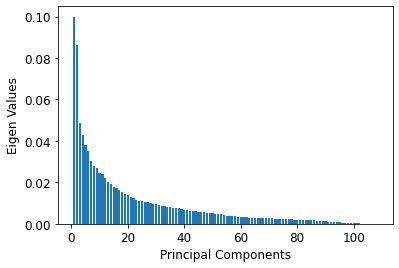

In [116]:
# Plotting variance ratio 
plt.bar(range(1,len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_)
plt.xlabel('Principal Components')
plt.ylabel('Eigen Values')

In [117]:
# lets check the cumulative variance to identify how many components explain 90% of data
var_cumu = np.cumsum(pca.explained_variance_ratio_)

### Scree plot

Text(0, 0.5, 'Eigen Values')

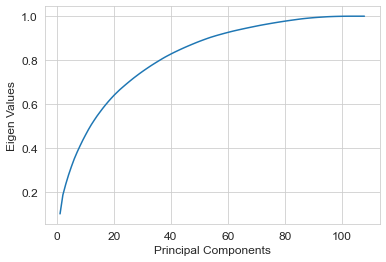

In [118]:
sns.set_style('whitegrid')
plt.plot(range(1,len(var_cumu)+1), var_cumu)
plt.xlabel('Principal Components')
plt.ylabel('Eigen Values')

#### Approximately 60-70 components explain 95% of the data

In [119]:
# 70 PCs as explaining 95% of the data which we can see from the plot.
pc70 = PCA(n_components = 70, random_state = 0)
X_test.shape
X_train.shape

(21000, 108)

In [120]:
# Lets transform our train and test data with PCA
pc70.fit(X_train)
X_train_pca = pc70.transform(X_train)
X_test_pca = pc70.transform(X_test)
print(X_train_pca.shape)
print(X_test_pca.shape)

(21000, 70)
(9001, 70)


### Logistic regression with PCA

In [121]:
from sklearn.pipeline import Pipeline

pca = PCA(n_components = 70)
logreg = LogisticRegression(class_weight = 'balanced', random_state = 0) 

pipe = Pipeline([('pca', pca), ('logistic', logreg)])

In [122]:
# Fitting the pipeline to our train data
pipe.fit(X_train, y_train)

Pipeline(steps=[('pca', PCA(n_components=70)),
                ('logistic',
                 LogisticRegression(class_weight='balanced', random_state=0))])

In [123]:
# Lets check the score on our train data
pipe.score(X_train, y_train)

0.8196190476190476

In [124]:
# Evaluation on our test data
y_pred = pipe.predict(X_test)

In [125]:
# Confusion matrix
confusion5 = metrics.confusion_matrix(y_test, y_pred)
print(confusion5)

[[6727 1542]
 [ 132  600]]


In [126]:
# Let's check the overall accuracy
print(metrics.accuracy_score(y_test, y_pred))

0.8140206643706255


In [127]:
# Lets derive the followuing to find specificity and sensitivity
TP = confusion5[1,1] # true positive 
TN = confusion5[0,0] # true negatives
FP = confusion5[0,1] # false positives
FN = confusion5[1,0] # false negatives

In [128]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.819672131147541

In [129]:
# Let us calculate specificity
TN / float(TN+FP)

0.8135203773128552

#### Metrics
- Accuracy - 81.2%
- Sensitivity - 81.6%
- Specificity - 81.2%

### Hyperparameter tuning - Logistic Regression

In [130]:
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score

pca = PCA()

logreg = LogisticRegression(class_weight = 'balanced', random_state = 0)

pipe = Pipeline([('pca', pca), ('logistic', logreg)])

# Hyperparameter tuning

params = {'pca__n_components': [60, 70], 'logistic__C': [0.1, 0.5, 1, 2, 3, 4, 5, 10], 'logistic__penalty': ['l1', 'l2']}

# Creating 3 folds

folds = StratifiedKFold(n_splits = 3, shuffle = True, random_state = 0)

model = GridSearchCV(estimator = pipe, cv = folds, param_grid = params, scoring = 'roc_auc', n_jobs = -1, verbose = 1)

In [131]:
# Fitting our model
model.fit(X_train, y_train)

Fitting 3 folds for each of 32 candidates, totalling 96 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   19.5s
[Parallel(n_jobs=-1)]: Done  96 out of  96 | elapsed:   38.6s finished


GridSearchCV(cv=StratifiedKFold(n_splits=3, random_state=0, shuffle=True),
             estimator=Pipeline(steps=[('pca', PCA()),
                                       ('logistic',
                                        LogisticRegression(class_weight='balanced',
                                                           random_state=0))]),
             n_jobs=-1,
             param_grid={'logistic__C': [0.1, 0.5, 1, 2, 3, 4, 5, 10],
                         'logistic__penalty': ['l1', 'l2'],
                         'pca__n_components': [60, 70]},
             scoring='roc_auc', verbose=1)

In [132]:
# Cross validation results
pd.DataFrame(model.cv_results_)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_logistic__C,param_logistic__penalty,param_pca__n_components,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,1.219,0.022,0.000,0.000,0.100,l1,60,"{'logistic__C': 0.1, 'logistic__penalty': 'l1'...",nan,nan,nan,nan,nan,32
1,1.549,0.154,0.000,0.000,0.100,l1,70,"{'logistic__C': 0.1, 'logistic__penalty': 'l1'...",nan,nan,nan,nan,nan,20
2,1.612,0.144,0.055,0.017,0.100,l2,60,"{'logistic__C': 0.1, 'logistic__penalty': 'l2'...",0.887,0.889,0.894,0.890,0.003,14
3,1.874,0.171,0.058,0.012,0.100,l2,70,"{'logistic__C': 0.1, 'logistic__penalty': 'l2'...",0.889,0.888,0.895,0.891,0.003,5
4,1.019,0.021,0.000,0.000,0.500,l1,60,"{'logistic__C': 0.5, 'logistic__penalty': 'l1'...",nan,nan,nan,nan,nan,23
5,1.120,0.030,0.000,0.000,0.500,l1,70,"{'logistic__C': 0.5, 'logistic__penalty': 'l1'...",nan,nan,nan,nan,nan,24
6,1.356,0.155,0.045,0.010,0.500,l2,60,"{'logistic__C': 0.5, 'logistic__penalty': 'l2'...",0.887,0.890,0.894,0.891,0.003,7
7,2.076,0.126,0.049,0.002,0.500,l2,70,"{'logistic__C': 0.5, 'logistic__penalty': 'l2'...",0.888,0.889,0.895,0.891,0.003,10
8,1.111,0.089,0.000,0.000,1,l1,60,"{'logistic__C': 1, 'logistic__penalty': 'l1', ...",nan,nan,nan,nan,nan,27
9,1.056,0.066,0.000,0.000,1,l1,70,"{'logistic__C': 1, 'logistic__penalty': 'l1', ...",nan,nan,nan,nan,nan,30


In [133]:
# Extracting best hyperparameters
print("AUC: ", model.best_score_)
print("Hyperparameters: ", model.best_params_)

AUC:  0.8911781283486947
Hyperparameters:  {'logistic__C': 5, 'logistic__penalty': 'l2', 'pca__n_components': 70}


In [134]:
# Evaluation on our test data
y_pred = model.predict(X_test)

In [135]:
# Confusion matrix
confusion6 = metrics.confusion_matrix(y_test, y_pred)
print(confusion6)

[[6738 1531]
 [ 133  599]]


In [136]:
# Let's check the overall accuracy
print(metrics.accuracy_score(y_test, y_pred))

0.8151316520386623


In [137]:
# Lets derive the followuing to find specificity and sensitivity
TP = confusion6[1,1] # true positive 
TN = confusion6[0,0] # true negatives
FP = confusion6[0,1] # false positives
FN = confusion6[1,0] # false negatives

In [138]:
# Let's see the sensitivity of our logistic regression model
Sensitivity = TP / float(TP+FN)
Sensitivity

0.8183060109289617

In [139]:
# Let us calculate specificity
TN / float(TN+FP)

0.8148506469947998

In [140]:
# Let us calculate Precision
Precision = TP / float(TP+FP)
Precision

0.2812206572769953

In [141]:
# Let's see the F1 score of our logistic regression model
F1_score = 2*(Precision * Sensitivity)/(Precision + Sensitivity)
F1_score

0.4185883997204752

#### Metrics - Logistic regression with PCA after hyperparameter tuning
- Accuracy - 81.2%
- Sensitivity - 82.1%
- Specificity - 81.1%
- Precision - 28.1%

### Random forests with PCA

In [142]:
from sklearn.ensemble import RandomForestClassifier

# Running the random forest with default parameters

rfc = RandomForestClassifier(class_weight = 'balanced', random_state = 0)

In [143]:
# Fitting our model on PCA transformed data
rfc.fit(X_train_pca, y_train)

RandomForestClassifier(class_weight='balanced', random_state=0)

In [144]:
# Making predictions on PCA transformed test data
predictions = rfc.predict(X_test_pca)

In [145]:
# Confusion matrix
confusion7 = metrics.confusion_matrix(y_test, predictions)
print(confusion7)

[[8209   60]
 [ 657   75]]


In [146]:
print(metrics.accuracy_score(y_test,predictions))

0.9203421842017554


In [147]:
# Lets derive the followuing to find specificity and sensitivity
TP = confusion7[1,1] # true positive 
TN = confusion7[0,0] # true negatives
FP = confusion7[0,1] # false positives
FN = confusion7[1,0] # false negatives

In [148]:
# Let's see the sensitivity of our model
TP / float(TP+FN)

0.10245901639344263

In [149]:
# Let us calculate specificity
TN / float(TN+FP)

0.9927439835530294

#### Metrics
- Accuracy - 92%
- Sensitivity - 10.2%
- Specificity - 99.2%

### Hypermeter tuning - Random forest

In [150]:
# Creating the parameter grid based on the results of random search
param_grid = {'max_depth': [4,5,6], 
              'n_estimators': [100, 200, 400], 
              'max_features': [7, 12, 15], 
              'min_samples_leaf': range(100, 300, 150), 
              'min_samples_split': range(200, 500, 100)}

rfc = RandomForestClassifier(class_weight = 'balanced', random_state = 0)

grid_search = GridSearchCV(estimator = rfc, param_grid = param_grid, cv = 3, n_jobs = -1, verbose = 1)

In [151]:
# Fitting the grid search to the PCA transformed data
grid_search.fit(X_train_pca, y_train)

Fitting 3 folds for each of 162 candidates, totalling 486 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed: 25.6min
[Parallel(n_jobs=-1)]: Done 486 out of 486 | elapsed: 29.3min finished


GridSearchCV(cv=3,
             estimator=RandomForestClassifier(class_weight='balanced',
                                              random_state=0),
             n_jobs=-1,
             param_grid={'max_depth': [4, 5, 6], 'max_features': [7, 12, 15],
                         'min_samples_leaf': range(100, 300, 150),
                         'min_samples_split': range(200, 500, 100),
                         'n_estimators': [100, 200, 400]},
             verbose=1)

In [152]:
# Printing the optimal accuracy score and hyperparameters
print('Accuracy of the model is',grid_search.best_score_,'with these parameters',grid_search.best_params_)

Accuracy of the model is 0.8671428571428571 with these parameters {'max_depth': 6, 'max_features': 7, 'min_samples_leaf': 100, 'min_samples_split': 200, 'n_estimators': 400}


In [153]:
# Fitting the final model with the best parameters obtained from grid search
rfc = RandomForestClassifier(bootstrap = True,
                             max_depth = 6,
                             min_samples_leaf = 100, 
                             min_samples_split = 200,
                             max_features = 7,
                             n_estimators = 400, 
                             class_weight = 'balanced', 
                             random_state = 0)

In [154]:
# Fitting the final model on PCA transformed train data
rfc.fit(X_train_pca, y_train)

RandomForestClassifier(class_weight='balanced', max_depth=6, max_features=7,
                       min_samples_leaf=100, min_samples_split=200,
                       n_estimators=400, random_state=0)

In [155]:
# Predictions on PCA transformed test data
predictions = rfc.predict(X_test_pca)

In [156]:
# Confusion matrix
confusion8 = metrics.confusion_matrix(y_test, predictions)
print(confusion8)

[[7179 1090]
 [ 200  532]]


In [157]:
print(metrics.accuracy_score(y_test, predictions))

0.8566825908232418


In [158]:
# Lets derive the followuing to find specificity and sensitivity
TP = confusion8[1,1] # true positive 
TN = confusion8[0,0] # true negatives
FP = confusion8[0,1] # false positives
FN = confusion8[1,0] # false negatives

In [159]:
# Let's see the sensitivity of our model
Sensitivity = TP / float(TP+FN)
Sensitivity

0.726775956284153

In [160]:
# Let us calculate specificity
TN / float(TN+FP)

0.8681823678800339

In [161]:
# Let us calculate Precision
Precision = TP / float(TP+FP)
Precision

0.3279901356350185

In [162]:
# Let's see the F1 score of our final logistic regression model
F1_score = 2*(Precision * Sensitivity)/(Precision + Sensitivity)
F1_score

0.4519966015293118

#### Metrics - PCA with Random forests after hyperparameter tuning
- Accuracy - 85.6%
- Sensitivity - 72.6%
- Specificity - 86.8%
- Precision - 32.7%

### Decision trees PCA

In [163]:
from sklearn.tree import DecisionTreeClassifier

# Fitting the decision tree with default hyperparameters, apart from
# max_depth which is 5 so that we can plot and read the tree

dtc = DecisionTreeClassifier(max_depth = 5, class_weight = 'balanced', random_state = 0)

dtc.fit(X_train_pca, y_train)

DecisionTreeClassifier(class_weight='balanced', max_depth=5, random_state=0)

In [164]:
# Making predictions on PCA transformed test data
predictions = dtc.predict(X_test_pca)

In [165]:
# Confusion matrix
confusion9 = metrics.confusion_matrix(y_test, predictions)
print(confusion9)

[[6559 1710]
 [ 171  561]]


In [166]:
print(metrics.accuracy_score(y_test, predictions))

0.791023219642262


In [167]:
# Lets derive the followuing to find specificity and sensitivity
TP = confusion9[1,1] # true positive 
TN = confusion9[0,0] # true negatives
FP = confusion9[0,1] # false positives
FN = confusion9[1,0] # false negatives

In [168]:
# Let's see the sensitivity of our model
TP / float(TP+FN)

0.7663934426229508

In [169]:
# Let us calculate specificity
TN / float(TN+FP)

0.7932035312613376

### Metrics
- Accuracy - 79.1%
- Sensitivity - 76.6%
- Specificity - 79.3%

### Hyperparameter tuning - Decision trees

In [170]:
param_grid = {'max_depth': range(5, 10, 1),
              'min_samples_leaf': range(25, 150, 25),
              'min_samples_split': range(25, 150, 25),
              'criterion': ["entropy", "gini"]}

dtree = DecisionTreeClassifier(class_weight = 'balanced', random_state = 0)

grid_search = GridSearchCV(estimator = dtree, param_grid = param_grid, cv = 3, n_jobs = -1, verbose = 1)

In [171]:
# Fitting the grid search to the PCA transformed data
grid_search.fit(X_train_pca, y_train)

Fitting 3 folds for each of 250 candidates, totalling 750 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   11.4s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   54.3s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 750 out of 750 | elapsed:  3.1min finished


GridSearchCV(cv=3,
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              random_state=0),
             n_jobs=-1,
             param_grid={'criterion': ['entropy', 'gini'],
                         'max_depth': range(5, 10),
                         'min_samples_leaf': range(25, 150, 25),
                         'min_samples_split': range(25, 150, 25)},
             verbose=1)

In [172]:
# Printing the optimal accuracy score and hyperparameters
print('Accuracy of the model is',grid_search.best_score_,'with',grid_search.best_params_)

Accuracy of the model is 0.816952380952381 with {'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 100, 'min_samples_split': 25}


In [173]:
# Fitting the final model with the best parameters obtained from grid search
dtc = DecisionTreeClassifier(max_depth = 5,
                             min_samples_leaf = 100, 
                             min_samples_split = 25,
                             criterion = 'gini', 
                             class_weight = 'balanced', 
                             random_state = 0)

In [174]:
# Fitting our final model on our PCA transformed train data
dtc.fit(X_train_pca, y_train)

DecisionTreeClassifier(class_weight='balanced', max_depth=5,
                       min_samples_leaf=100, min_samples_split=25,
                       random_state=0)

In [175]:
# Predictions on PCA transformed test data
predictions = dtc.predict(X_test_pca)

In [176]:
# Confusion matrix
confusion10 = metrics.confusion_matrix(y_test, predictions)
print(confusion10)

[[6732 1537]
 [ 188  544]]


In [177]:
print(metrics.accuracy_score(y_test, predictions))

0.8083546272636374


In [178]:
# Lets derive the followuing to find specificity and sensitivity
TP = confusion10[1,1] # true positive 
TN = confusion10[0,0] # true negatives
FP = confusion10[0,1] # false positives
FN = confusion10[1,0] # false negatives

In [179]:
# Let's see the sensitivity of our logistic regression model
Sensitivity = TP / float(TP+FN)
Sensitivity

0.7431693989071039

In [180]:
# Let us calculate specificity
TN / float(TN+FP)

0.8141250453501028

In [181]:
# Let us calculate Precision
Precision = TP / float(TP+FP)
Precision

0.26141278231619414

In [182]:
# Let's see the F1 score of decision tree model
F1_score = 2*(Precision * Sensitivity)/(Precision + Sensitivity)
F1_score

0.3867756843227871

#### Metrics - Decision tree with PCA after hyperparameter tuning
- Accuracy - 80.8%
- Sensitivity - 74.3%
- Specificity - 81.4%
- Precision - 26.1%

### Getting important features from Logistic regression model without PCA

In [186]:
# Important features
pd.options.display.float_format = '{:.2f}'.format
new_params = res.params[1:]
new_params

arpu_8                     0.39
onnet_mou_6                0.19
offnet_mou_6               0.24
loc_og_t2m_mou_8          -0.46
total_og_mou_7            -0.99
loc_ic_t2t_mou_8          -0.46
loc_ic_t2m_mou_8          -0.63
spl_ic_mou_8              -0.65
total_rech_num_7          -0.62
last_day_rch_amt_8        -0.66
sep_vbc_3g                -1.33
fb_user_8                 -0.79
total_og_mou_7_8_diff     -0.67
total_rech_num_7_8_diff   -0.66
dtype: float64

In [187]:
feature_importance = new_params
feature_importance = 100.0 * (feature_importance / feature_importance.max())
feature_importance

arpu_8                     100.00
onnet_mou_6                 48.18
offnet_mou_6                61.56
loc_og_t2m_mou_8          -117.22
total_og_mou_7            -252.61
loc_ic_t2t_mou_8          -116.90
loc_ic_t2m_mou_8          -160.78
spl_ic_mou_8              -165.00
total_rech_num_7          -157.97
last_day_rch_amt_8        -169.85
sep_vbc_3g                -340.11
fb_user_8                 -202.74
total_og_mou_7_8_diff     -171.04
total_rech_num_7_8_diff   -169.07
dtype: float64

In [188]:
sorted_idx = np.argsort(feature_importance,kind='quicksort',order='list of str')
sorted_idx

arpu_8                     10
onnet_mou_6                 4
offnet_mou_6               11
loc_og_t2m_mou_8           12
total_og_mou_7              9
loc_ic_t2t_mou_8           13
loc_ic_t2m_mou_8            7
spl_ic_mou_8                6
total_rech_num_7            8
last_day_rch_amt_8          3
sep_vbc_3g                  5
fb_user_8                   1
total_og_mou_7_8_diff       2
total_rech_num_7_8_diff     0
dtype: int64

In [191]:
pd.DataFrame(feature_importance).reset_index().sort_values(by=0,ascending=False)

,index,0
0,arpu_8,100.00
2,offnet_mou_6,61.56
1,onnet_mou_6,48.18
5,loc_ic_t2t_mou_8,-116.90
3,loc_og_t2m_mou_8,-117.22
8,total_rech_num_7,-157.97
6,loc_ic_t2m_mou_8,-160.78
7,spl_ic_mou_8,-165.00
13,total_rech_num_7_8_diff,-169.07
9,last_day_rch_amt_8,-169.85


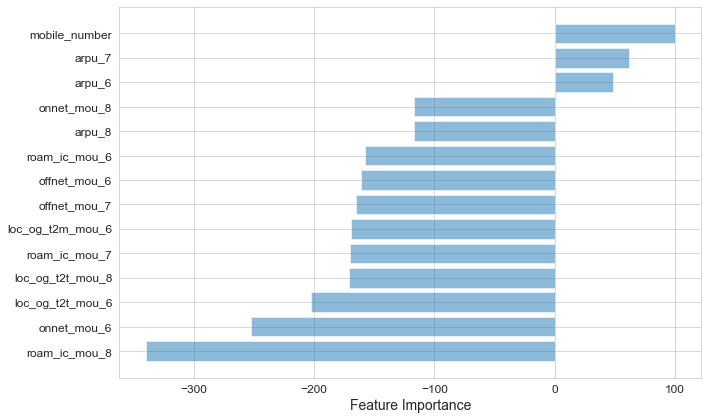

In [190]:
pos = np.arange(sorted_idx.shape[0]) + .5

featfig = plt.figure(figsize=(10,6))
featax = featfig.add_subplot(1, 1, 1)
featax.barh(pos, feature_importance[sorted_idx], align='center', color = 'tab:blue',alpha=0.5)
featax.set_yticks(pos)
featax.set_yticklabels(np.array(X_train.columns)[sorted_idx], fontsize=12)
featax.set_xlabel('Feature Importance', fontsize=14)

plt.tight_layout()   
plt.show()

### Insights
As it can be inferred from the above graph
    
- The company needs to concentrate on the users that donot avail most of the telecom services in the 8th month to retain the customers
    
- It can be seen that the users do not get any incoming calls or they also do not do any local outgoing calls. This can mean that the user has another number on another telecom operator which may be his primary contact number. The company can offer exclusive MNP (mobile number portability) packages for the user if he wishes to switch his primary telecom operator
    
- Also providing offers on recharges, cashbacks and also streaming service subscriptions such as Netflix, Prime, and more may also retain the current users

- Data and internet plans must also be addressed in order to retain these users. Services such as unlimited social network data usage where the usage of facebook, what's app and other social network apps will not consume the monthly data. This type of service can be seen in countries like United Kingdom where the targeted user group is students and young people under the age of 30

### Best model according to performance

- Logistic regression with PCA provided:
    - Accuracy - 81.2%
    - Sensitivity - 82.1%
    - Specificity - 81.1%
- Random forests with PCA provided:
    - Accuracy - 85.6%
    - Sensitivity - 72.6%
    - Specificity - 86.8%
- Decision trees with PCA provided:
    - Accuracy - 80.8%
    - Sensitivity - 74.3%
    - Specificity - 81.4%

By looking at the above metrics logistic regression seems to be a more balanced model where the sensitivity is high. This means that the model has identified the people who have churned, correctly. As the focus is on retaining the churned users this would be important. 